In [6]:
# 导入必要的库
import os
import sys
import io
import base64
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont  # 添加ImageDraw和ImageFont的导入
import fitz  # PyMuPDF

# 添加项目根目录到系统路径
project_root = "/Users/acproject/workspace/python_projects/embedding_server"
sys.path.append(project_root)

# 导入相关服务
from app.services.pdf_service import PDFService
from app.services.pdf.core import PDFService as PDFCoreService
from app.services.pdf.formula import FormulaExtractor
from app.services.pdf.layout import LayoutAnalyzer
from app.services.pdf.text import TextExtractor
from app.services.pdf.table import TableExtractor
from app.services.pdf.visualization import PDFVisualization

# 设置日志
import logging
logging.basicConfig(level=logging.INFO)

In [7]:
def display_image(image):
    """显示PIL图像或numpy数组图像"""
    plt.figure(figsize=(10, 14))
    if isinstance(image, np.ndarray):
        plt.imshow(image)
    else:
        plt.imshow(np.array(image))
    plt.axis('off')
    plt.show()

In [8]:
def load_test_pdf(pdf_path):
    """加载测试PDF文件"""
    with open(pdf_path, 'rb') as f:
        pdf_content = f.read()
    return pdf_content

# 指定测试PDF路径 - 请替换为您的测试PDF文件
test_pdf_path = project_root + '/examples/2024-Aligning Large Language Models with Humans.pdf'  # 替换为实际路径

In [ ]:
# 3. 创建布局信息存储结构和坐标映射
class PDFLayoutInfo:
    """PDF布局信息存储结构"""
    
    def __init__(self, pdf_path=None, pdf_content=None):
        """初始化PDF布局信息"""
        self.pdf_path = pdf_path
        self.pdf_content = pdf_content
        self.pages = []  # 存储所有页面的布局信息
        self.original_sizes = []  # 存储原始PDF页面尺寸
        self.model_sizes = []  # 存储模型处理的尺寸
        self.rendered_sizes = []  # 存储渲染后的图像尺寸
        self.formulas = {}  # 存储公式信息，格式: {页码: [公式列表]}
        self.tables = {}  # 存储表格信息，格式: {页码: [表格列表]}
        self.figures = {}  # 存储图片信息，格式: {页码: [图片列表]}
        
    def add_page(self, page_idx, layout_elements, rendered_size, model_size, original_size=None):
        """添加页面布局信息"""
        # 确保页面索引有效
        while len(self.pages) <= page_idx:
            self.pages.append([])
            self.original_sizes.append(None)
            self.model_sizes.append(None)
            self.rendered_sizes.append(None)
            
        # 存储布局元素和尺寸信息
        self.pages[page_idx] = layout_elements
        self.rendered_sizes[page_idx] = rendered_size
        self.model_sizes[page_idx] = model_size
        if original_size:
            self.original_sizes[page_idx] = original_size
        
    def get_page_layout(self, page_idx):
        """获取指定页面的布局信息"""
        if 0 <= page_idx < len(self.pages):
            return self.pages[page_idx]
        return []
    
    def get_element_by_type(self, page_idx, element_type):
        """获取指定页面中指定类型的所有元素"""
        if 0 <= page_idx < len(self.pages):
            return [elem for elem in self.pages[page_idx] if elem["type"].lower() == element_type.lower()]
        return []
    
    def map_coordinates(self, page_idx, coords, from_model_to_rendered=True):
        """
        映射坐标系统
        
        Args:
            page_idx: 页面索引
            coords: 坐标元组 (x0, y0, x1, y1)
            from_model_to_rendered: 如果为True，从模型坐标映射到渲染坐标；否则反之
            
        Returns:
            映射后的坐标元组
        """
        if 0 <= page_idx < len(self.pages):
            rendered_size = self.rendered_sizes[page_idx]
            model_size = self.model_sizes[page_idx]
            
            if not rendered_size or not model_size:
                return coords
            
            x0, y0, x1, y1 = coords
            
            # 添加偏移校正
            offset_x = int(rendered_size[0])  # 水平偏移校正，约5%
            offset_y = int(rendered_size[1])  # 垂直偏移校正，约5%
            
            if from_model_to_rendered:
                # 从模型坐标映射到渲染坐标
                x_ratio = rendered_size[0] / model_size[0]
                y_ratio = rendered_size[1] / model_size[1]
                
                mapped_x0 = max(0, int(x0 * x_ratio) - offset_x)
                mapped_y0 = max(0, int(y0 * y_ratio) - offset_y)
                mapped_x1 = max(mapped_x0 + 1, min(int(x1 * x_ratio) - offset_x, rendered_size[0]))
                mapped_y1 = max(mapped_y0 + 1, min(int(y1 * y_ratio) - offset_y, rendered_size[1]))
            else:
                # 从渲染坐标映射到模型坐标
                x_ratio = model_size[0] / rendered_size[0]
                y_ratio = model_size[1] / rendered_size[1]
                
                mapped_x0 = int((x0 + offset_x) * x_ratio)
                mapped_y0 = int((y0 + offset_y) * y_ratio)
                mapped_x1 = int((x1 + offset_x) * x_ratio)
                mapped_y1 = int((y1 + offset_y) * y_ratio)
                
            return (mapped_x0, mapped_y0, mapped_x1, mapped_y1)
        
        return coords  # 如果页面索引无效，返回原始坐标
    
    def get_cropped_element(self, page_idx, element_idx, image=None, use_original_coords=True):
        """
        从页面图像中裁剪出指定元素
        
        Args:
            page_idx: 页面索引
            element_idx: 元素索引
            image: 页面图像(PIL Image或numpy数组)，如果为None则需要重新渲染
            use_original_coords: 是否使用原始坐标
            
        Returns:
            裁剪后的图像
        """
        if 0 <= page_idx < len(self.pages) and 0 <= element_idx < len(self.pages[page_idx]):
            element = self.pages[page_idx][element_idx]
            
            # 获取坐标
            if use_original_coords and "original_coordinates" in element:
                coords = element["original_coordinates"]
            else:
                coords = element["coordinates"]
                # 如果需要，转换坐标
                if use_original_coords:
                    coords = self.map_coordinates(page_idx, coords)
                    
            # 确保坐标有效
            x0, y0, x1, y1 = [int(c) for c in coords]
            
            # 如果没有提供图像，尝试重新渲染
            if image is None and self.pdf_content:
                doc = fitz.open(stream=self.pdf_content, filetype="pdf")
                if 0 <= page_idx < len(doc):
                    page = doc[page_idx]
                    pix = page.get_pixmap(matrix=fitz.Matrix(3, 3))
                    img_data = pix.tobytes("png")
                    image = Image.open(io.BytesIO(img_data))
            
            # 裁剪图像
            if image is not None:
                if isinstance(image, np.ndarray):
                    if y1 <= image.shape[0] and x1 <= image.shape[1]:
                        return image[y0:y1, x0:x1]
                else:
                    if y1 <= image.height and x1 <= image.width:
                        return image.crop((x0, y0, x1, y1))
                
        return None
    
    def add_formula(self, page_idx, formula_info):
        """添加公式信息"""
        if page_idx not in self.formulas:
            self.formulas[page_idx] = []
        self.formulas[page_idx].append(formula_info)
    
    def add_table(self, page_idx, table_info):
        """添加表格信息"""
        if page_idx not in self.tables:
            self.tables[page_idx] = []
        self.tables[page_idx].append(table_info)
    
    def add_figure(self, page_idx, figure_info):
        """添加图片信息"""
        if page_idx not in self.figures:
            self.figures[page_idx] = []
        self.figures[page_idx].append(figure_info)
    
    def get_formulas(self, page_idx=None):
        """获取公式信息"""
        if page_idx is not None:
            return self.formulas.get(page_idx, [])
        return self.formulas
    
    def get_tables(self, page_idx=None):
        """获取表格信息"""
        if page_idx is not None:
            return self.tables.get(page_idx, [])
        return self.tables
    
    def get_figures(self, page_idx=None):
        """获取图片信息"""
        if page_idx is not None:
            return self.figures.get(page_idx, [])
        return self.figures
    
    def to_markdown(self, page_idx=None):
        """将PDF内容转换为Markdown格式"""
        markdown = ""
        
        # 处理指定页面或所有页面
        pages_to_process = [page_idx] if page_idx is not None else range(len(self.pages))
        
        for idx in pages_to_process:
            if 0 <= idx < len(self.pages):
                page_markdown = f"## 第 {idx+1} 页\n\n"
                
                # 按照元素在页面中的位置排序（从上到下）
                elements = sorted(self.pages[idx], key=lambda x: x["coordinates"][1])
                
                for element in elements:
                    element_type = element["type"].lower()
                    
                    if element_type == "title":
                        if "extracted_text" in element:
                            page_markdown += f"### {element['extracted_text']}\n\n"
                    
                    elif element_type == "plain text":
                        if "extracted_text" in element:
                            page_markdown += f"{element['extracted_text']}\n\n"
                    
                    elif element_type == "isolate_formula":
                        formula_idx = element.get("formula_idx")
                        if formula_idx is not None and idx in self.formulas:
                            for formula in self.formulas[idx]:
                                if formula.get("element_idx") == formula_idx:
                                    latex = formula.get("latex", "")
                                    page_markdown += f"$$\n{latex}\n$$\n\n"
                                    break
                    
                    elif element_type == "table":
                        table_idx = element.get("table_idx")
                        if table_idx is not None and idx in self.tables:
                            for table in self.tables[idx]:
                                if table.get("element_idx") == table_idx:
                                    table_md = table.get("markdown", "")
                                    page_markdown += f"{table_md}\n\n"
                                    break
                    
                    elif element_type == "figure":
                        figure_idx = element.get("figure_idx")
                        if figure_idx is not None and idx in self.figures:
                            for figure in self.figures[idx]:
                                if figure.get("element_idx") == figure_idx:
                                    img_base64 = figure.get("base64", "")
                                    caption = figure.get("caption", "图片")
                                    page_markdown += f"![{caption}](data:image/png;base64,{img_base64})\n\n"
                                    break
                
                markdown += page_markdown
                
                # 添加页面分隔符
                if idx < len(self.pages) - 1:
                    markdown += "---\n\n"
        
        return markdown

PDF页数: 24


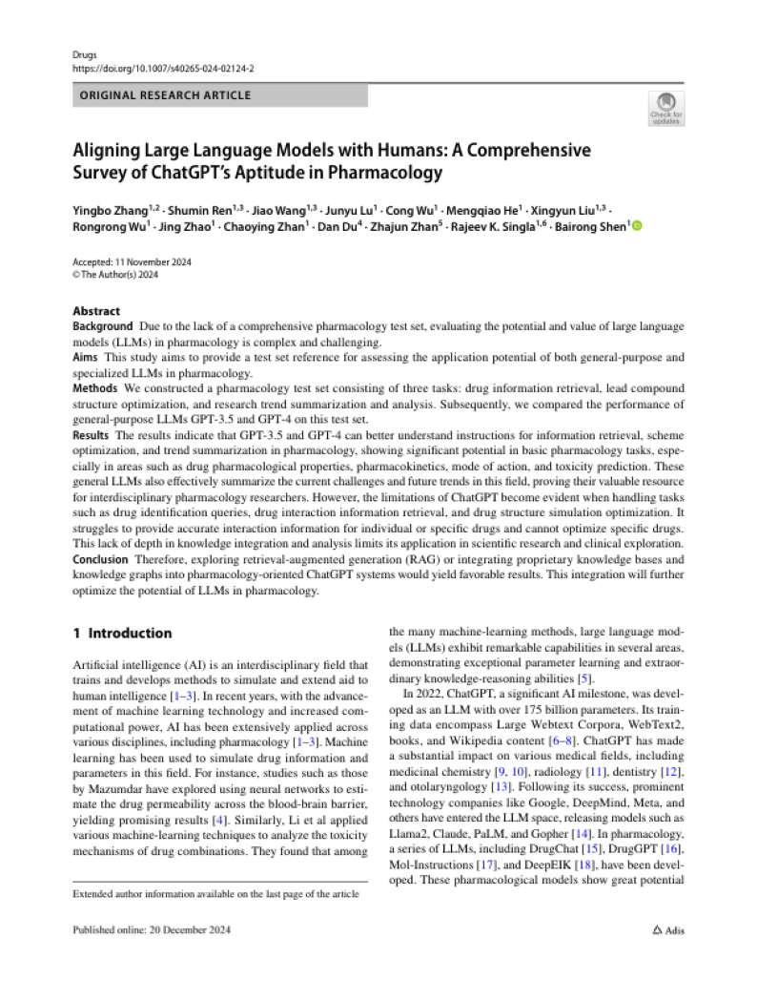

第一页文本前500个字符:
Vol.:(0123456789)
Drugs 
https://doi.org/10.1007/s40265-024-02124-2
ORIGINAL RESEARCH ARTICLE
Aligning Large Language Models with Humans: A Comprehensive 
Survey of ChatGPT’s Aptitude in Pharmacology
Yingbo Zhang1,2 · Shumin Ren1,3 · Jiao Wang1,3 · Junyu Lu1 · Cong Wu1 · Mengqiao He1 · Xingyun Liu1,3 · 
Rongrong Wu1 · Jing Zhao1 · Chaoying Zhan1 · Dan Du4 · Zhajun Zhan5 · Rajeev K. Singla1,6 · Bairong Shen1 
Accepted: 11 November 2024 
© The Author(s) 2024
Abstract
Background  Due to the lack of


In [9]:
# 1. 测试PDF加载和基本信息
def test_pdf_loading(pdf_content):
    """测试PDF加载和基本信息"""
    doc = fitz.open(stream=pdf_content, filetype="pdf")
    print(f"PDF页数: {len(doc)}")
    
    # 显示第一页
    page = doc[0]
    pix = page.get_pixmap()
    img = Image.open(io.BytesIO(pix.tobytes("png")))
    display_image(img)
    
    # 提取基本文本
    text = page.get_text()
    print(f"第一页文本前500个字符:\n{text[:500]}")
    
    return doc

# 加载测试PDF
pdf_content = load_test_pdf(test_pdf_path)
doc = test_pdf_loading(pdf_content)

PDF总页数: 24

处理第 1/24 页

0: 1024x800 3 titles, 10 plain texts, 6 abandons, 1765.8ms
Speed: 26.4ms preprocess, 1765.8ms inference, 1.6ms postprocess per image at shape (1, 3, 1024, 800)
第 1 页检测到的布局元素数量: 19
第 1 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [100, 66, 397, 106], 'confidence': 0.9230272173881531}, {'type': 'abandon', 'coordinates': [101, 118, 578, 159], 'confidence': 0.9304633140563965}, {'type': 'abandon', 'coordinates': [1029, 131, 1089, 189], 'confidence': 0.8972524404525757}, {'type': 'title', 'coordinates': [101, 208, 939, 281], 'confidence': 0.9638832211494446}, {'type': 'plain text', 'coordinates': [100, 310, 1018, 364], 'confidence': 0.9463964104652405}, {'type': 'plain text', 'coordinates': [101, 399, 295, 439], 'confidence': 0.9332128167152405}, {'type': 'title', 'coordinates': [101, 477, 180, 496], 'confidence': 0.8983834385871887}, {'type': 'plain text', 'coordinates': [102, 501, 1091, 549], 'confidence': 0.9318161606788635}, {'type': 'plain text', 'coordinates'

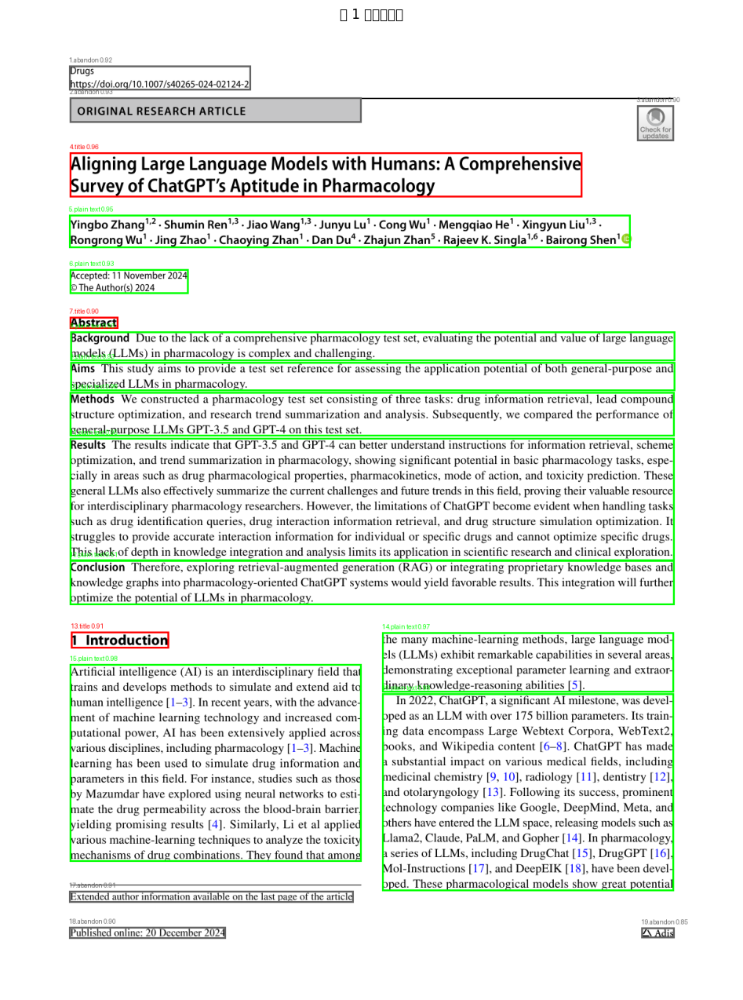


处理第 2/24 页

0: 1024x800 2 titles, 5 plain texts, 2 abandons, 1 table, 1466.3ms
Speed: 4.7ms preprocess, 1466.3ms inference, 0.3ms postprocess per image at shape (1, 3, 1024, 800)
第 2 页检测到的布局元素数量: 10
第 2 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [997, 64, 1089, 81], 'confidence': 0.9174947738647461}, {'type': 'plain text', 'coordinates': [611, 113, 1089, 210], 'confidence': 0.9765002727508545}, {'type': 'table', 'coordinates': [100, 114, 577, 796], 'confidence': 0.9481996893882751}, {'type': 'plain text', 'coordinates': [612, 215, 1091, 911], 'confidence': 0.9823302030563354}, {'type': 'plain text', 'coordinates': [100, 877, 579, 1126], 'confidence': 0.9824362993240356}, {'type': 'title', 'coordinates': [611, 984, 732, 1011], 'confidence': 0.9104717969894409}, {'type': 'title', 'coordinates': [612, 1035, 785, 1061], 'confidence': 0.9142428636550903}, {'type': 'plain text', 'coordinates': [612, 1088, 1091, 1437], 'confidence': 0.9770810008049011}, {'type': 'plain text', 'coordinate

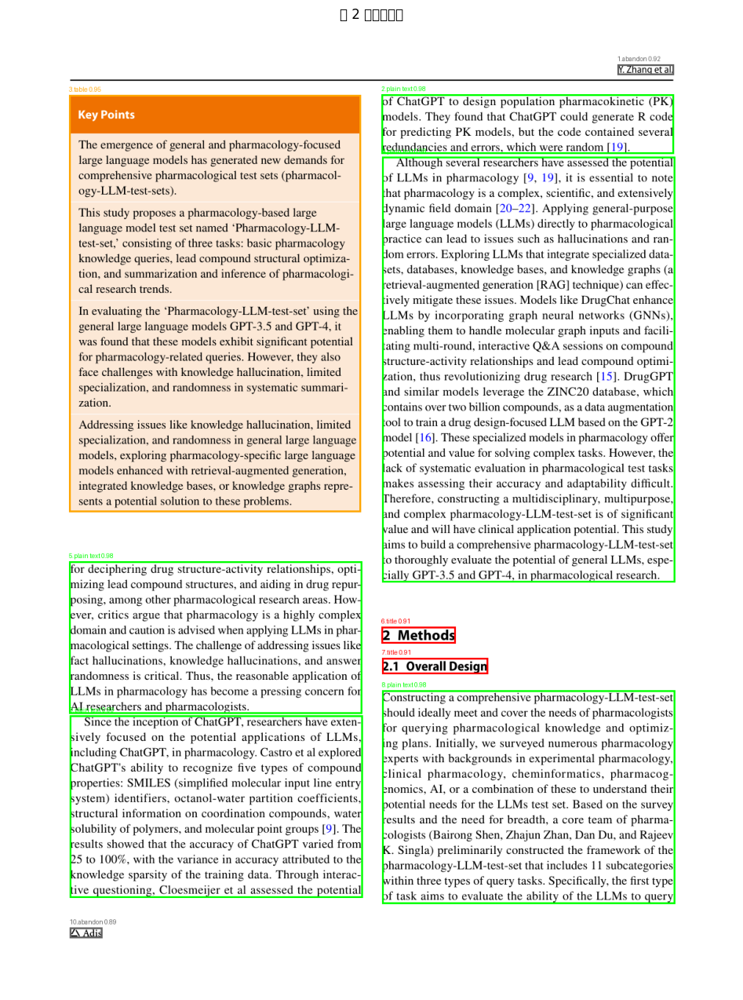


处理第 3/24 页

0: 1024x800 1 title, 6 plain texts, 2 abandons, 1460.8ms
Speed: 5.8ms preprocess, 1460.8ms inference, 0.6ms postprocess per image at shape (1, 3, 1024, 800)
第 3 页检测到的布局元素数量: 9
第 3 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [100, 64, 538, 82], 'confidence': 0.8837383389472961}, {'type': 'plain text', 'coordinates': [101, 110, 579, 259], 'confidence': 0.9807797074317932}, {'type': 'plain text', 'coordinates': [612, 111, 1091, 459], 'confidence': 0.9819751381874084}, {'type': 'plain text', 'coordinates': [101, 261, 579, 559], 'confidence': 0.985647439956665}, {'type': 'plain text', 'coordinates': [611, 461, 1091, 1434], 'confidence': 0.9811663031578064}, {'type': 'title', 'coordinates': [101, 583, 524, 610], 'confidence': 0.9344378113746643}, {'type': 'plain text', 'coordinates': [101, 636, 579, 1284], 'confidence': 0.9799904823303223}, {'type': 'plain text', 'coordinates': [101, 1286, 579, 1434], 'confidence': 0.977400004863739}, {'type': 'abandon', 'coordinates': [1036,

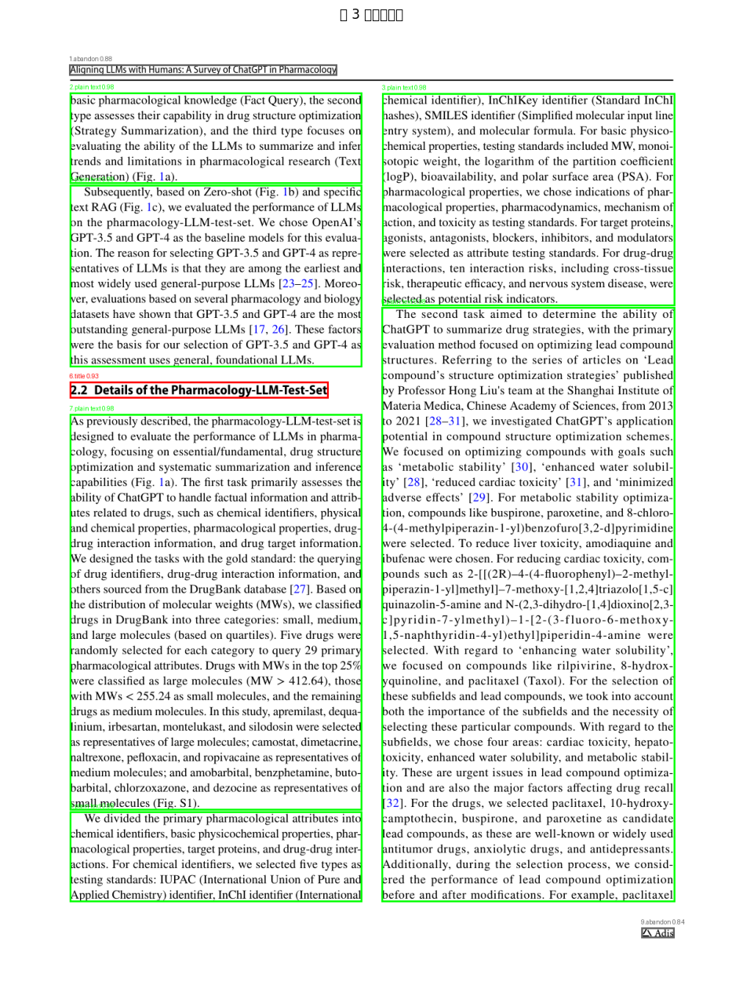


处理第 4/24 页

0: 1024x800 2 plain texts, 2 abandons, 1 figure, 2 figure_captions, 1443.9ms
Speed: 33.9ms preprocess, 1443.9ms inference, 0.1ms postprocess per image at shape (1, 3, 1024, 800)
第 4 页检测到的布局元素数量: 7
第 4 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [998, 65, 1089, 81], 'confidence': 0.9267799854278564}, {'type': 'figure', 'coordinates': [103, 110, 1086, 1149], 'confidence': 0.973132312297821}, {'type': 'figure_caption', 'coordinates': [99, 1178, 580, 1279], 'confidence': 0.9675584435462952}, {'type': 'figure_caption', 'coordinates': [611, 1178, 1090, 1279], 'confidence': 0.819067120552063}, {'type': 'plain text', 'coordinates': [101, 1311, 579, 1409], 'confidence': 0.974492073059082}, {'type': 'plain text', 'coordinates': [611, 1311, 1091, 1409], 'confidence': 0.9690294861793518}, {'type': 'abandon', 'coordinates': [101, 1475, 154, 1493], 'confidence': 0.8843650817871094}]
1. abandon
2. figure
3. figure_caption
4. figure_caption
5. plain text
6. plain text
7. abandon


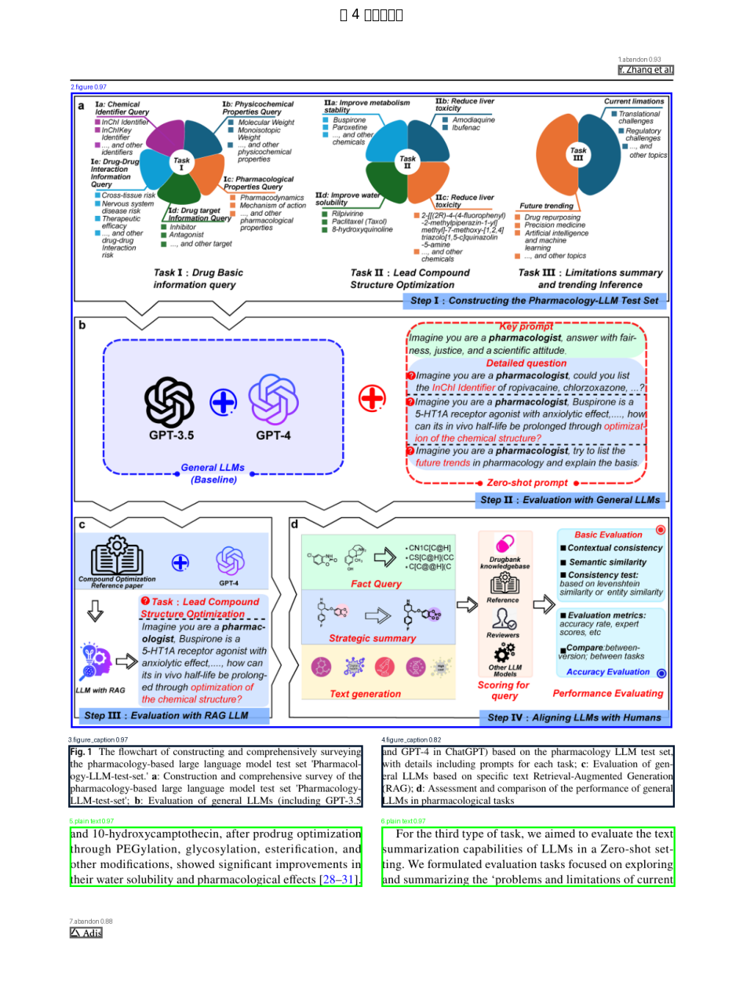


处理第 5/24 页

0: 1024x800 1 title, 9 plain texts, 2 abandons, 1 isolate_formula, 1410.1ms
Speed: 4.4ms preprocess, 1410.1ms inference, 0.1ms postprocess per image at shape (1, 3, 1024, 800)
第 5 页检测到的布局元素数量: 13
第 5 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [100, 64, 538, 82], 'confidence': 0.8846109509468079}, {'type': 'plain text', 'coordinates': [612, 111, 1089, 183], 'confidence': 0.9710316061973572}, {'type': 'plain text', 'coordinates': [101, 111, 579, 158], 'confidence': 0.9593013525009155}, {'type': 'plain text', 'coordinates': [101, 162, 579, 684], 'confidence': 0.9837225079536438}, {'type': 'plain text', 'coordinates': [612, 187, 1091, 833], 'confidence': 0.9801192283630371}, {'type': 'plain text', 'coordinates': [101, 687, 579, 859], 'confidence': 0.9825164079666138}, {'type': 'plain text', 'coordinates': [612, 837, 1089, 959], 'confidence': 0.9742979407310486}, {'type': 'title', 'coordinates': [101, 884, 553, 934], 'confidence': 0.9531287550926208}, {'type': 'plain text',

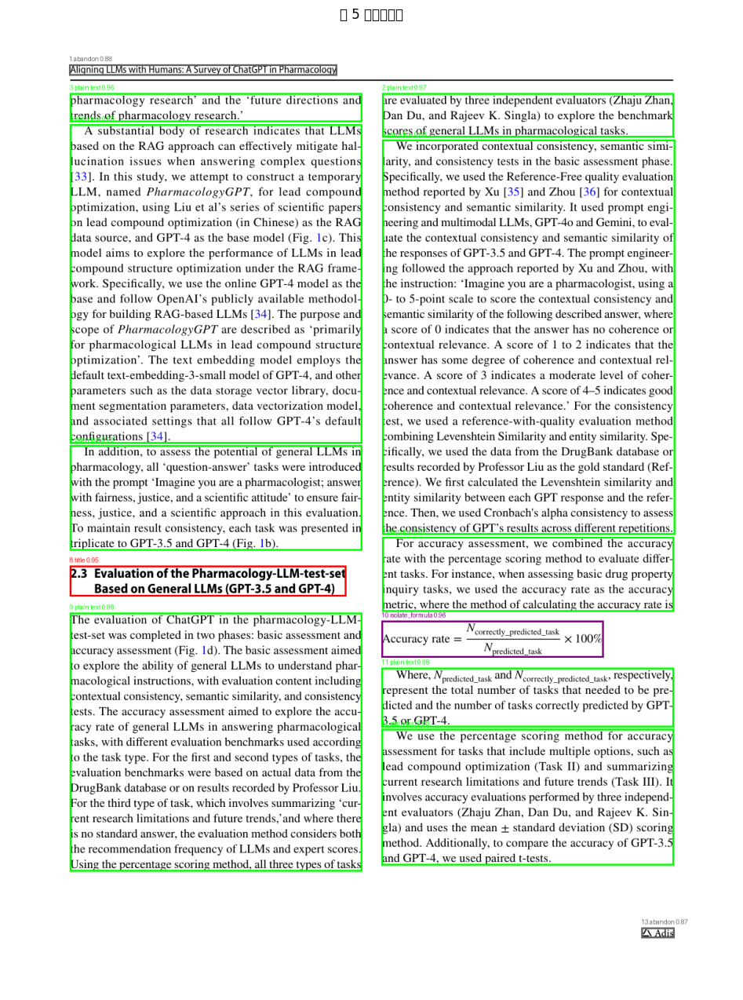


处理第 6/24 页

0: 1024x800 6 titles, 12 plain texts, 2 abandons, 1399.7ms
Speed: 4.1ms preprocess, 1399.7ms inference, 0.3ms postprocess per image at shape (1, 3, 1024, 800)
第 6 页检测到的布局元素数量: 20
第 6 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [997, 64, 1089, 81], 'confidence': 0.9199806451797485}, {'type': 'title', 'coordinates': [100, 110, 559, 135], 'confidence': 0.8130355477333069}, {'type': 'plain text', 'coordinates': [643, 111, 1089, 158], 'confidence': 0.9513251185417175}, {'type': 'title', 'coordinates': [101, 111, 560, 135], 'confidence': 0.5501291751861572}, {'type': 'plain text', 'coordinates': [101, 162, 579, 335], 'confidence': 0.982521653175354}, {'type': 'plain text', 'coordinates': [611, 162, 1089, 358], 'confidence': 0.9363812804222107}, {'type': 'plain text', 'coordinates': [101, 339, 579, 685], 'confidence': 0.9801732897758484}, {'type': 'plain text', 'coordinates': [611, 362, 1089, 458], 'confidence': 0.9229580760002136}, {'type': 'plain text', 'coordinates': [612, 

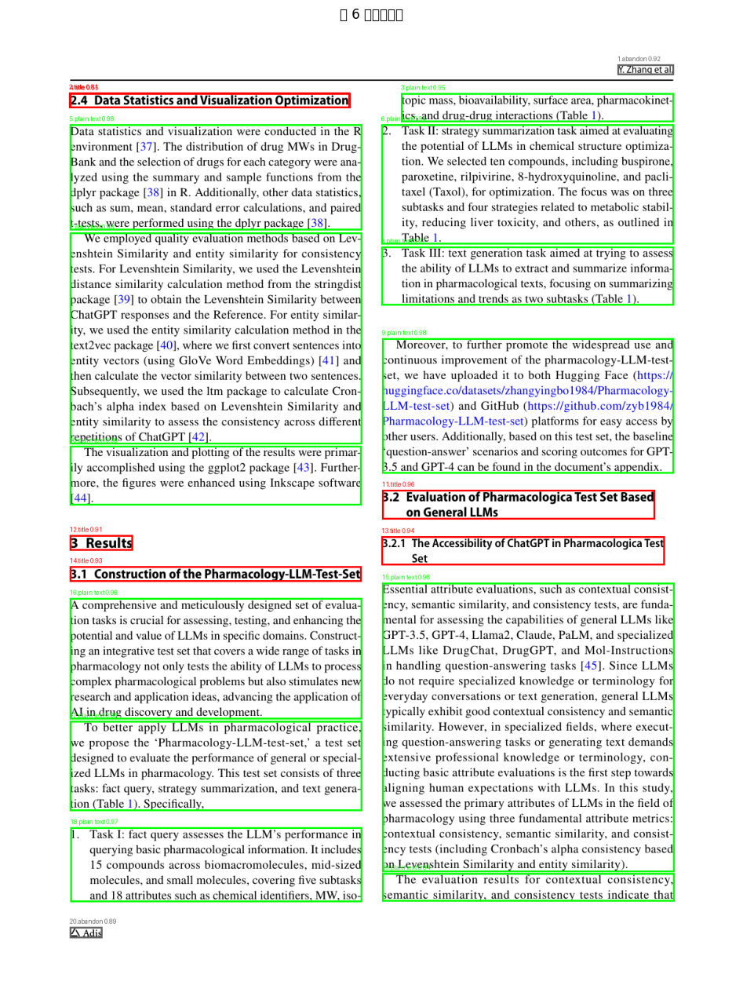


处理第 7/24 页

0: 1024x800 3 abandons, 1 table, 3 table_captions, 1 table_footnote, 1463.2ms
Speed: 19.3ms preprocess, 1463.2ms inference, 0.1ms postprocess per image at shape (1, 3, 1024, 800)
第 7 页检测到的布局元素数量: 8
第 7 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [99, 64, 538, 82], 'confidence': 0.8663328289985657}, {'type': 'abandon', 'coordinates': [145, 64, 515, 82], 'confidence': 0.4912585914134979}, {'type': 'table', 'coordinates': [160, 111, 984, 1201], 'confidence': 0.8491942882537842}, {'type': 'table_caption', 'coordinates': [135, 117, 162, 1437], 'confidence': 0.4463484585285187}, {'type': 'table_caption', 'coordinates': [104, 670, 128, 1395], 'confidence': 0.38630032539367676}, {'type': 'table_footnote', 'coordinates': [753, 953, 774, 1200], 'confidence': 0.25360018014907837}, {'type': 'table_caption', 'coordinates': [142, 1326, 161, 1431], 'confidence': 0.3933703303337097}, {'type': 'abandon', 'coordinates': [1036, 1476, 1090, 1493], 'confidence': 0.865254282951355}]
1. aband

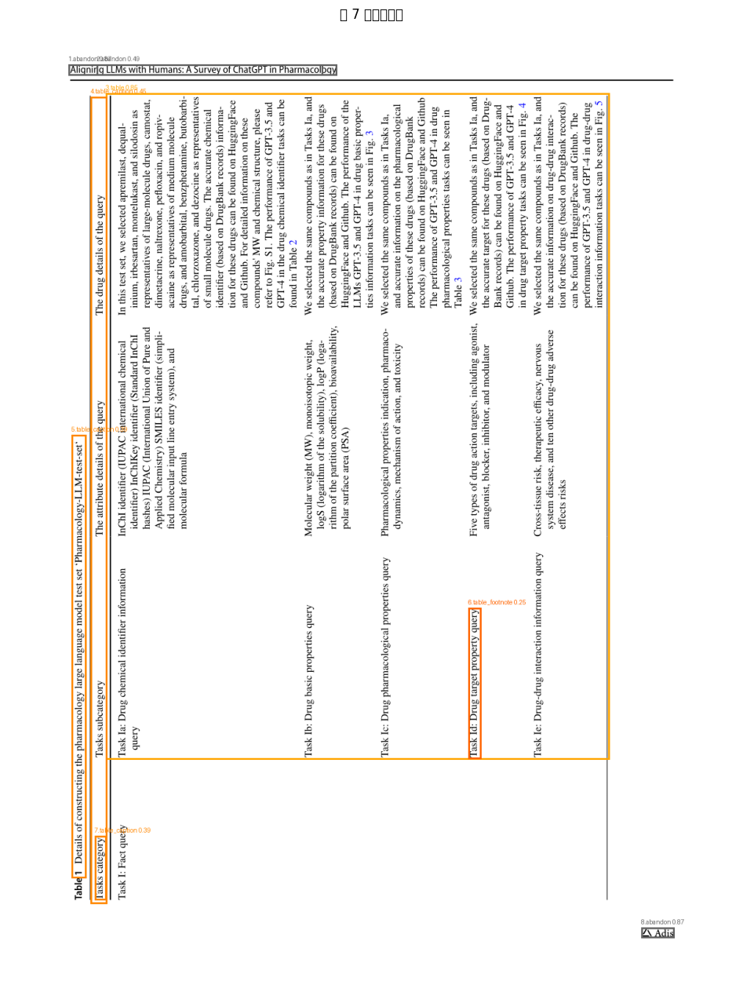


处理第 8/24 页

0: 1024x800 2 abandons, 1 table, 6 table_captions, 4 table_footnotes, 1434.4ms
Speed: 4.9ms preprocess, 1434.4ms inference, 0.1ms postprocess per image at shape (1, 3, 1024, 800)
第 8 页检测到的布局元素数量: 13
第 8 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [997, 64, 1089, 81], 'confidence': 0.9071744084358215}, {'type': 'table', 'coordinates': [129, 103, 864, 1455], 'confidence': 0.8753930330276489}, {'type': 'table_footnote', 'coordinates': [640, 114, 855, 471], 'confidence': 0.3348195254802704}, {'type': 'table_footnote', 'coordinates': [319, 116, 425, 470], 'confidence': 0.2780967950820923}, {'type': 'table_footnote', 'coordinates': [166, 124, 305, 473], 'confidence': 0.5606318712234497}, {'type': 'table_caption', 'coordinates': [131, 274, 153, 476], 'confidence': 0.46645596623420715}, {'type': 'table_caption', 'coordinates': [131, 610, 152, 838], 'confidence': 0.5093722343444824}, {'type': 'table_caption', 'coordinates': [870, 1151, 891, 1432], 'confidence': 0.684174895286560

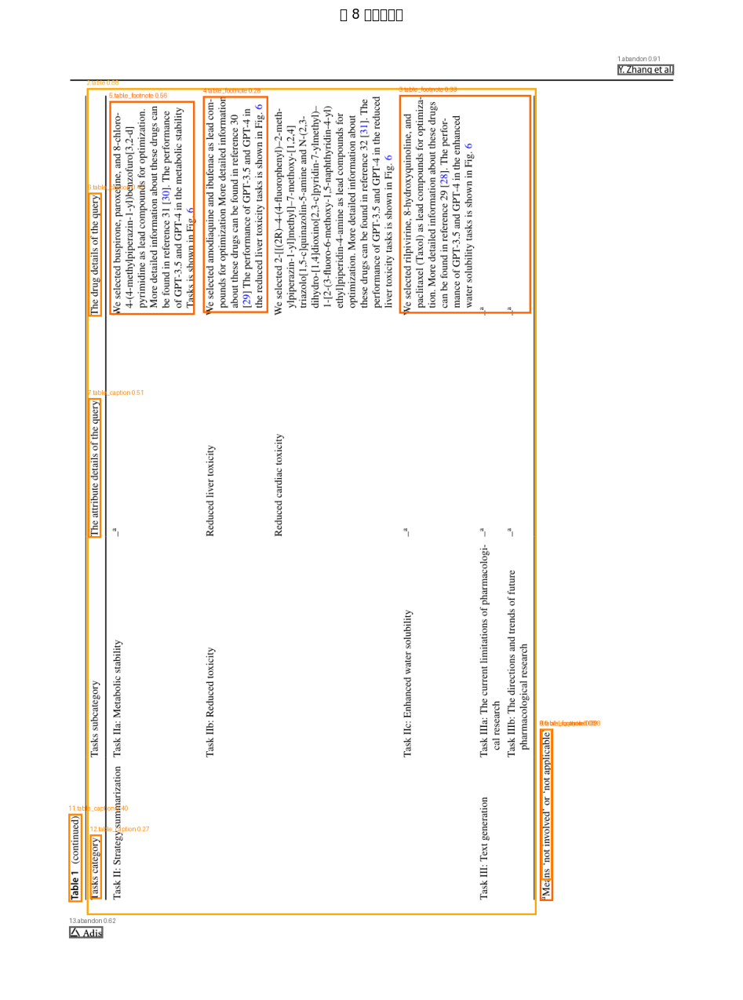


处理第 9/24 页

0: 1024x800 1 title, 6 plain texts, 3 abandons, 1 figure, 1 figure_caption, 1525.2ms
Speed: 13.4ms preprocess, 1525.2ms inference, 0.3ms postprocess per image at shape (1, 3, 1024, 800)
第 9 页检测到的布局元素数量: 12
第 9 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [100, 64, 538, 82], 'confidence': 0.8869100213050842}, {'type': 'abandon', 'coordinates': [145, 64, 515, 82], 'confidence': 0.5292014479637146}, {'type': 'plain text', 'coordinates': [611, 111, 1089, 284], 'confidence': 0.982700526714325}, {'type': 'plain text', 'coordinates': [101, 111, 579, 459], 'confidence': 0.9825035929679871}, {'type': 'plain text', 'coordinates': [611, 287, 1090, 484], 'confidence': 0.9830196499824524}, {'type': 'title', 'coordinates': [101, 485, 489, 533], 'confidence': 0.9519889950752258}, {'type': 'plain text', 'coordinates': [612, 487, 1089, 684], 'confidence': 0.9809885621070862}, {'type': 'plain text', 'coordinates': [100, 560, 578, 683], 'confidence': 0.9647934436798096}, {'type': 'figure',

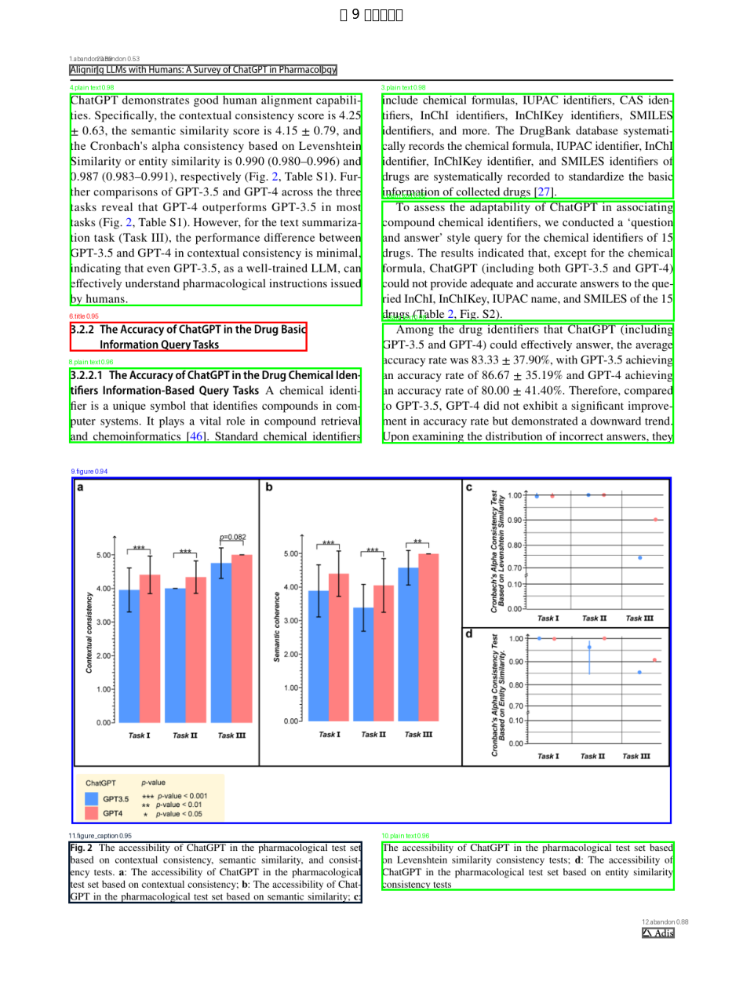


处理第 10/24 页

0: 1024x800 10 plain texts, 2 abandons, 1 table, 2 table_captions, 1 table_footnote, 1430.6ms
Speed: 5.1ms preprocess, 1430.6ms inference, 0.2ms postprocess per image at shape (1, 3, 1024, 800)
第 10 页检测到的布局元素数量: 16
第 10 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [997, 64, 1089, 81], 'confidence': 0.919924259185791}, {'type': 'plain text', 'coordinates': [611, 111, 1090, 409], 'confidence': 0.9844397306442261}, {'type': 'plain text', 'coordinates': [101, 111, 579, 234], 'confidence': 0.9798077940940857}, {'type': 'plain text', 'coordinates': [101, 236, 579, 409], 'confidence': 0.9828307628631592}, {'type': 'plain text', 'coordinates': [612, 411, 1089, 609], 'confidence': 0.9829666614532471}, {'type': 'plain text', 'coordinates': [100, 435, 579, 609], 'confidence': 0.9807501435279846}, {'type': 'table_caption', 'coordinates': [97, 655, 1075, 693], 'confidence': 0.38543856143951416}, {'type': 'table_caption', 'coordinates': [164, 670, 905, 692], 'confidence': 0.374684095

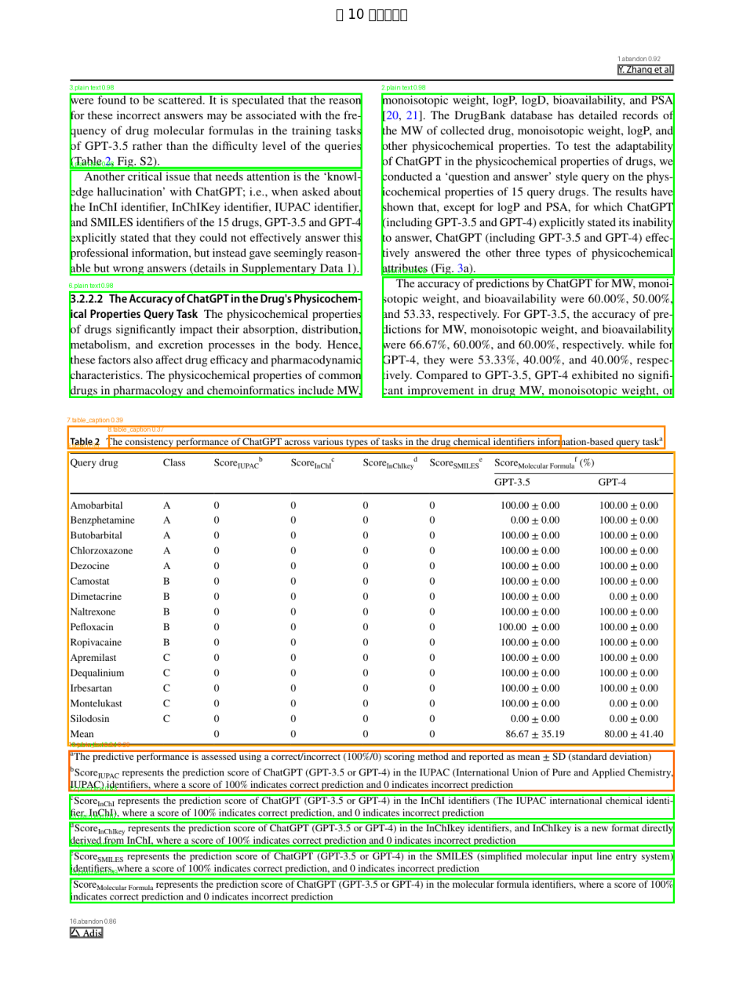


处理第 11/24 页

0: 1024x800 9 plain texts, 3 abandons, 1441.4ms
Speed: 4.4ms preprocess, 1441.4ms inference, 0.1ms postprocess per image at shape (1, 3, 1024, 800)
第 11 页检测到的布局元素数量: 12
第 11 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [100, 64, 538, 82], 'confidence': 0.8862256407737732}, {'type': 'abandon', 'coordinates': [145, 64, 515, 82], 'confidence': 0.5180830955505371}, {'type': 'plain text', 'coordinates': [101, 110, 580, 284], 'confidence': 0.9823926687240601}, {'type': 'plain text', 'coordinates': [611, 111, 1089, 184], 'confidence': 0.9707804322242737}, {'type': 'plain text', 'coordinates': [612, 187, 1091, 709], 'confidence': 0.9814560413360596}, {'type': 'plain text', 'coordinates': [101, 312, 579, 809], 'confidence': 0.9825368523597717}, {'type': 'plain text', 'coordinates': [612, 712, 1089, 859], 'confidence': 0.9187174439430237}, {'type': 'plain text', 'coordinates': [101, 812, 579, 1259], 'confidence': 0.9839401245117188}, {'type': 'plain text', 'coordinates': [611, 86

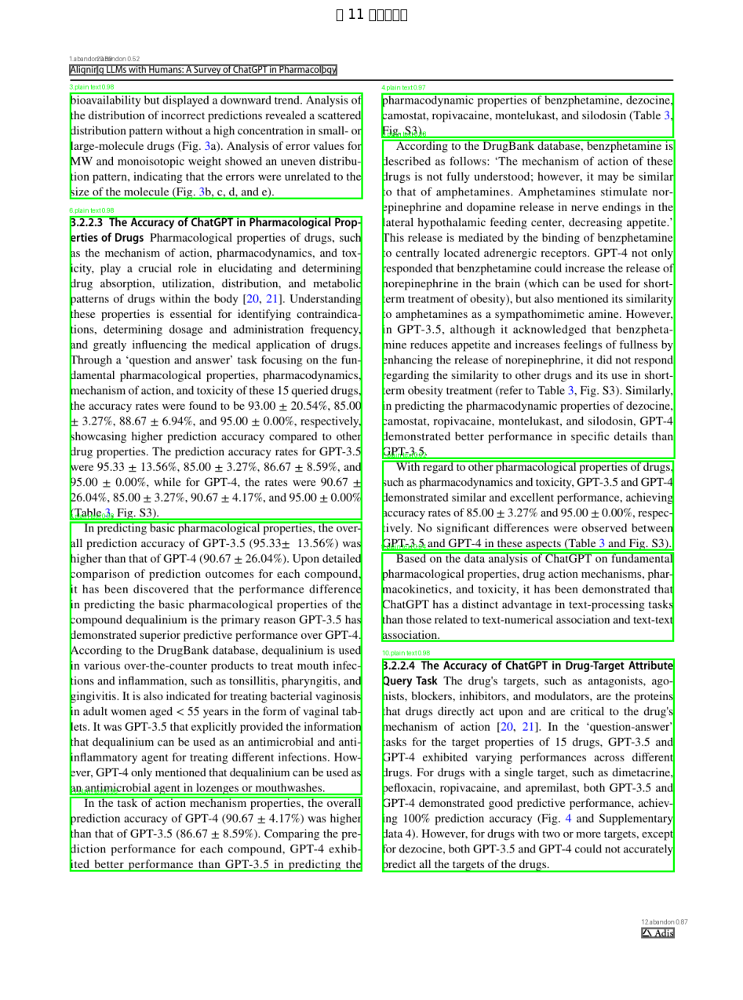


处理第 12/24 页

0: 1024x800 2 abandons, 1 figure, 1478.0ms
Speed: 5.0ms preprocess, 1478.0ms inference, 0.2ms postprocess per image at shape (1, 3, 1024, 800)
第 12 页检测到的布局元素数量: 3
第 12 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [997, 64, 1089, 81], 'confidence': 0.9222643971443176}, {'type': 'figure', 'coordinates': [183, 106, 1006, 1396], 'confidence': 0.9248011708259583}, {'type': 'abandon', 'coordinates': [101, 1476, 154, 1493], 'confidence': 0.8709506988525391}]
1. abandon
2. figure
3. abandon


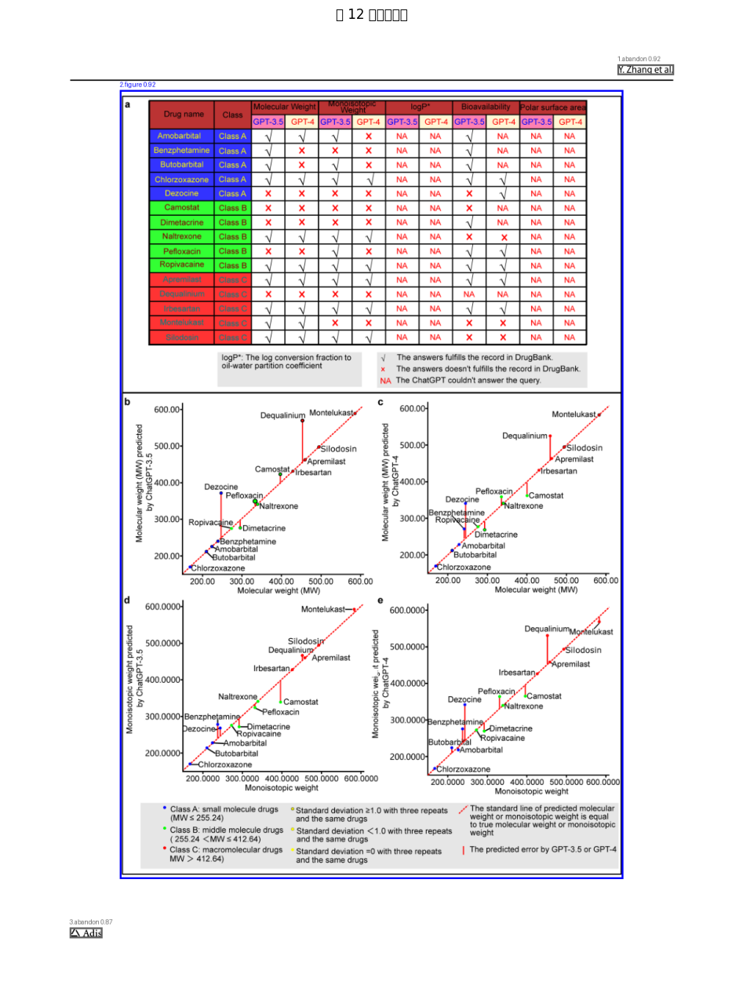


处理第 13/24 页

0: 1024x800 7 plain texts, 3 abandons, 1 figure_caption, 1396.5ms
Speed: 4.5ms preprocess, 1396.5ms inference, 0.1ms postprocess per image at shape (1, 3, 1024, 800)
第 13 页检测到的布局元素数量: 11
第 13 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [99, 64, 538, 82], 'confidence': 0.8696684837341309}, {'type': 'abandon', 'coordinates': [145, 64, 515, 82], 'confidence': 0.4892655313014984}, {'type': 'plain text', 'coordinates': [612, 111, 1090, 384], 'confidence': 0.9840642213821411}, {'type': 'figure_caption', 'coordinates': [94, 112, 578, 352], 'confidence': 0.955676257610321}, {'type': 'plain text', 'coordinates': [101, 386, 579, 859], 'confidence': 0.8802217245101929}, {'type': 'plain text', 'coordinates': [612, 387, 1091, 835], 'confidence': 0.9836804866790771}, {'type': 'plain text', 'coordinates': [612, 836, 1090, 1059], 'confidence': 0.9840945601463318}, {'type': 'plain text', 'coordinates': [101, 862, 579, 1259], 'confidence': 0.9074916839599609}, {'type': 'plain text', 'co

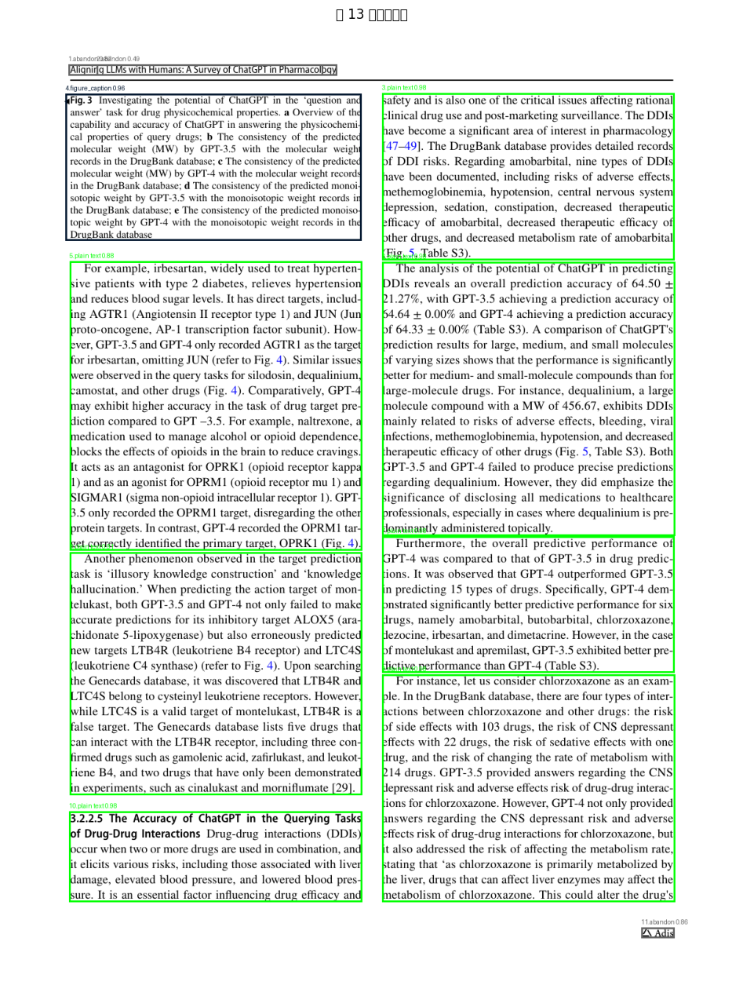


处理第 14/24 页

0: 1024x800 1 title, 4 plain texts, 2 abandons, 1 table, 1 table_caption, 1 table_footnote, 1430.1ms
Speed: 4.1ms preprocess, 1430.1ms inference, 0.3ms postprocess per image at shape (1, 3, 1024, 800)
第 14 页检测到的布局元素数量: 10
第 14 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [997, 64, 1089, 81], 'confidence': 0.9187241196632385}, {'type': 'table_caption', 'coordinates': [99, 118, 689, 140], 'confidence': 0.9079310894012451}, {'type': 'table', 'coordinates': [97, 146, 1092, 626], 'confidence': 0.9906221032142639}, {'type': 'table_footnote', 'coordinates': [100, 634, 1091, 839], 'confidence': 0.8300173878669739}, {'type': 'plain text', 'coordinates': [612, 886, 1090, 1284], 'confidence': 0.980657160282135}, {'type': 'plain text', 'coordinates': [101, 886, 578, 959], 'confidence': 0.9671840667724609}, {'type': 'title', 'coordinates': [101, 986, 573, 1033], 'confidence': 0.9504898190498352}, {'type': 'plain text', 'coordinates': [101, 1061, 579, 1409], 'confidence': 0.978092908

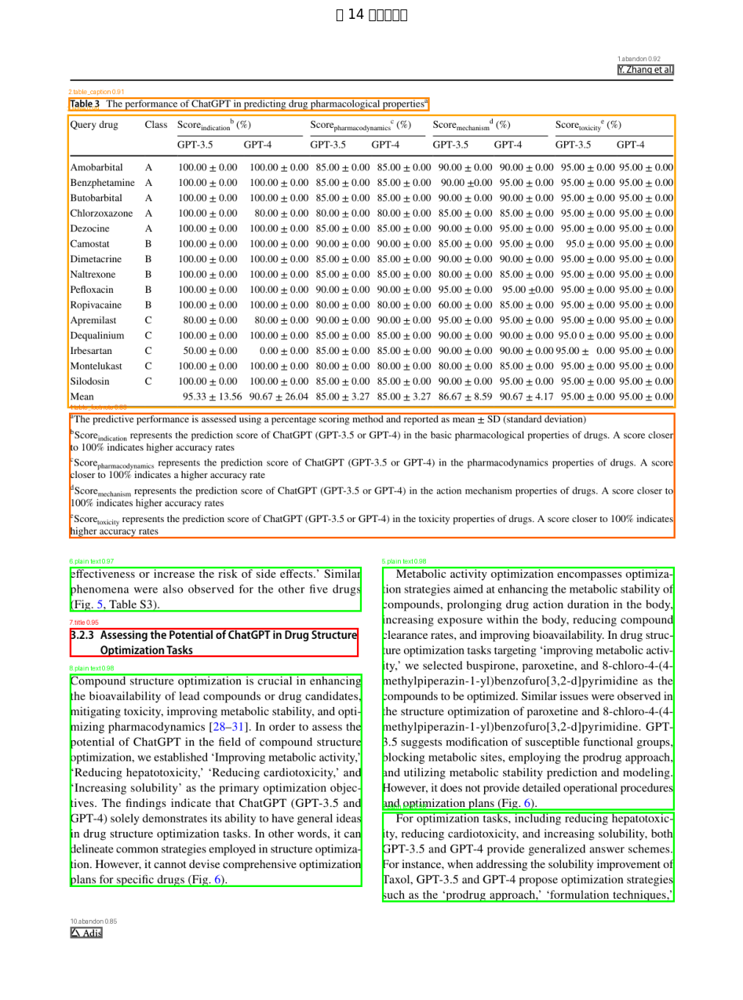


处理第 15/24 页

0: 1024x800 2 plain texts, 3 abandons, 1 figure, 2 figure_captions, 1425.9ms
Speed: 4.8ms preprocess, 1425.9ms inference, 0.2ms postprocess per image at shape (1, 3, 1024, 800)
第 15 页检测到的布局元素数量: 8
第 15 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [100, 64, 538, 82], 'confidence': 0.866132915019989}, {'type': 'abandon', 'coordinates': [145, 64, 515, 82], 'confidence': 0.5072962045669556}, {'type': 'figure', 'coordinates': [104, 112, 1084, 1090], 'confidence': 0.8743188977241516}, {'type': 'figure_caption', 'coordinates': [100, 1121, 580, 1182], 'confidence': 0.9536421298980713}, {'type': 'figure_caption', 'coordinates': [610, 1121, 1090, 1182], 'confidence': 0.8336511254310608}, {'type': 'plain text', 'coordinates': [100, 1236, 579, 1435], 'confidence': 0.9787485599517822}, {'type': 'plain text', 'coordinates': [611, 1236, 1091, 1385], 'confidence': 0.977783739566803}, {'type': 'abandon', 'coordinates': [1037, 1476, 1090, 1493], 'confidence': 0.8884437680244446}]
1. aban

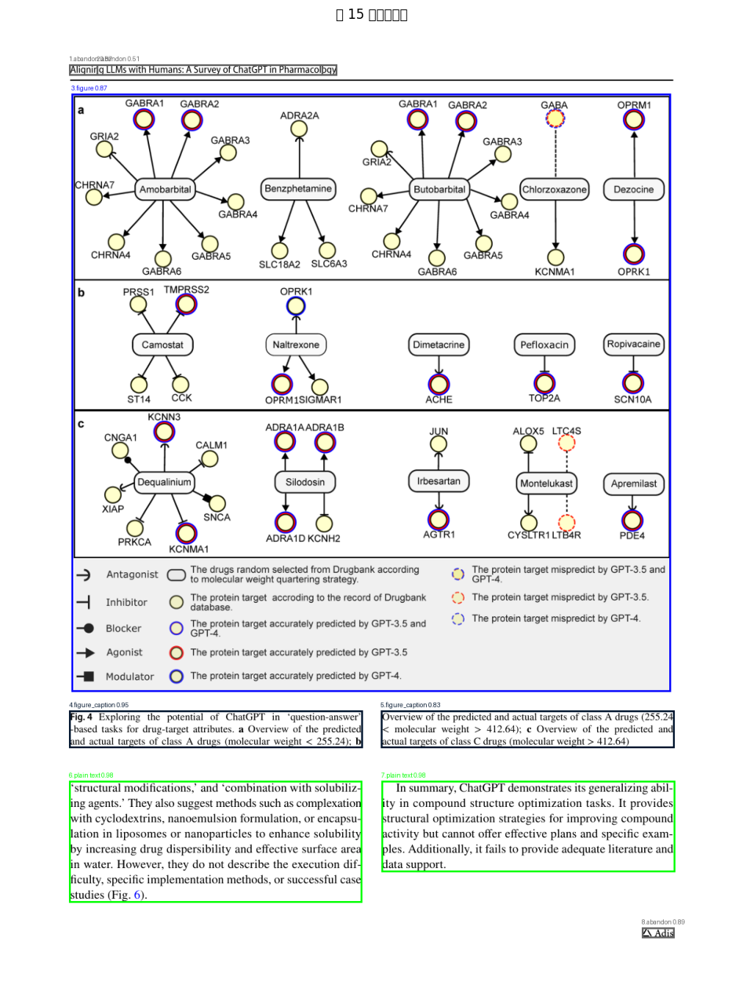


处理第 16/24 页

0: 1024x800 2 abandons, 1 figure, 1528.0ms
Speed: 5.0ms preprocess, 1528.0ms inference, 0.2ms postprocess per image at shape (1, 3, 1024, 800)
第 16 页检测到的布局元素数量: 3
第 16 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [997, 65, 1089, 81], 'confidence': 0.9112483859062195}, {'type': 'figure', 'coordinates': [163, 76, 1017, 1409], 'confidence': 0.9468974471092224}, {'type': 'abandon', 'coordinates': [101, 1475, 155, 1493], 'confidence': 0.8444713950157166}]
1. abandon
2. figure
3. abandon


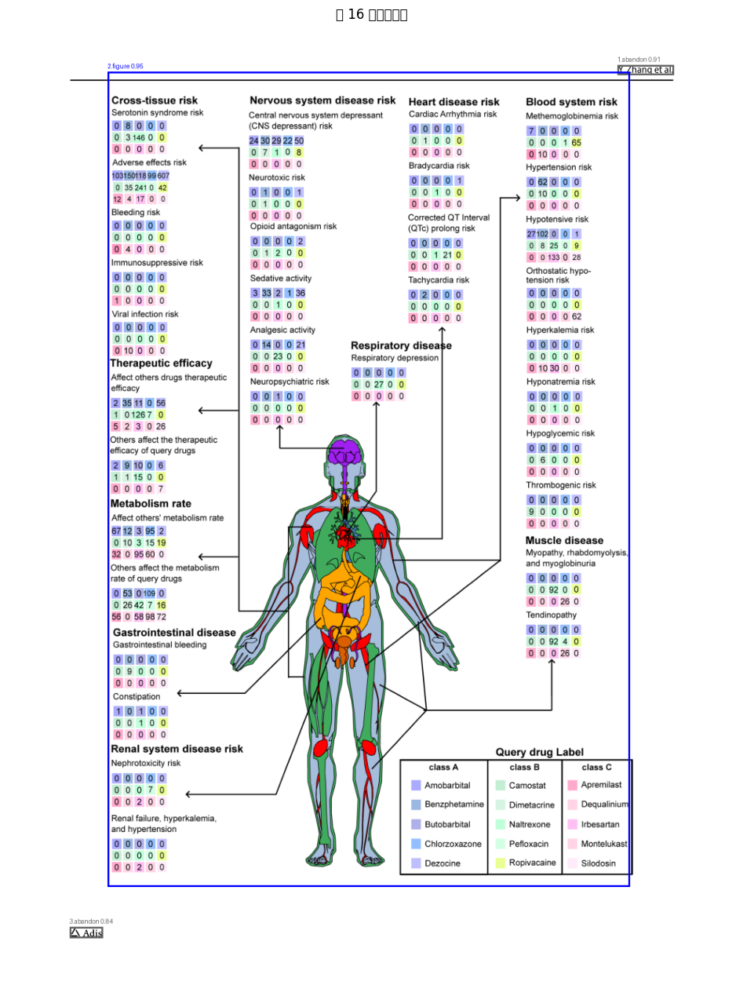


处理第 17/24 页

0: 1024x800 2 titles, 8 plain texts, 3 abandons, 1 figure_caption, 1494.1ms
Speed: 5.8ms preprocess, 1494.1ms inference, 0.2ms postprocess per image at shape (1, 3, 1024, 800)
第 17 页检测到的布局元素数量: 14
第 17 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [100, 64, 538, 82], 'confidence': 0.8735122680664062}, {'type': 'abandon', 'coordinates': [145, 64, 515, 82], 'confidence': 0.48445776104927063}, {'type': 'plain text', 'coordinates': [611, 111, 1090, 408], 'confidence': 0.9830195307731628}, {'type': 'figure_caption', 'coordinates': [94, 112, 579, 272], 'confidence': 0.8641229867935181}, {'type': 'title', 'coordinates': [101, 311, 557, 384], 'confidence': 0.9588510394096375}, {'type': 'plain text', 'coordinates': [101, 411, 579, 558], 'confidence': 0.9795605540275574}, {'type': 'plain text', 'coordinates': [611, 436, 1090, 885], 'confidence': 0.981659471988678}, {'type': 'plain text', 'coordinates': [101, 586, 580, 834], 'confidence': 0.9807326197624207}, {'type': 'plain text',

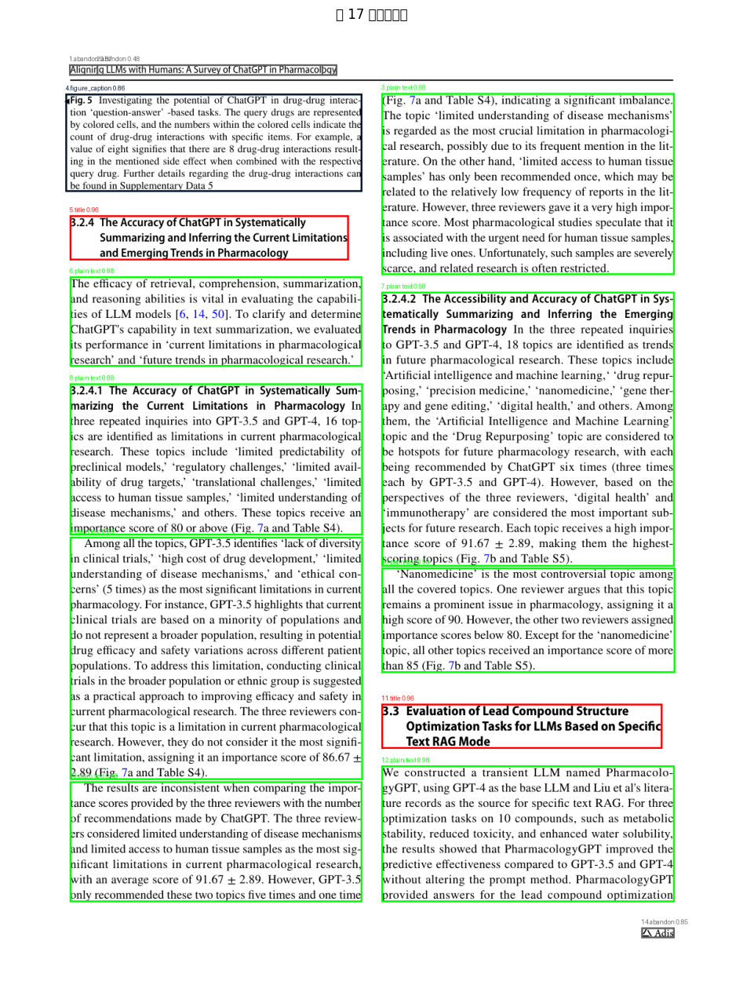


处理第 18/24 页

0: 1024x800 2 plain texts, 2 abandons, 1 figure, 1 figure_caption, 1554.5ms
Speed: 6.3ms preprocess, 1554.5ms inference, 0.2ms postprocess per image at shape (1, 3, 1024, 800)
第 18 页检测到的布局元素数量: 6
第 18 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [997, 64, 1089, 81], 'confidence': 0.9200051426887512}, {'type': 'figure', 'coordinates': [366, 110, 1090, 1278], 'confidence': 0.9417991638183594}, {'type': 'figure_caption', 'coordinates': [99, 110, 319, 773], 'confidence': 0.8715450167655945}, {'type': 'plain text', 'coordinates': [101, 1335, 579, 1434], 'confidence': 0.970084547996521}, {'type': 'plain text', 'coordinates': [610, 1336, 1090, 1409], 'confidence': 0.9606477618217468}, {'type': 'abandon', 'coordinates': [101, 1475, 154, 1493], 'confidence': 0.8659376502037048}]
1. abandon
2. figure
3. figure_caption
4. plain text
5. plain text
6. abandon


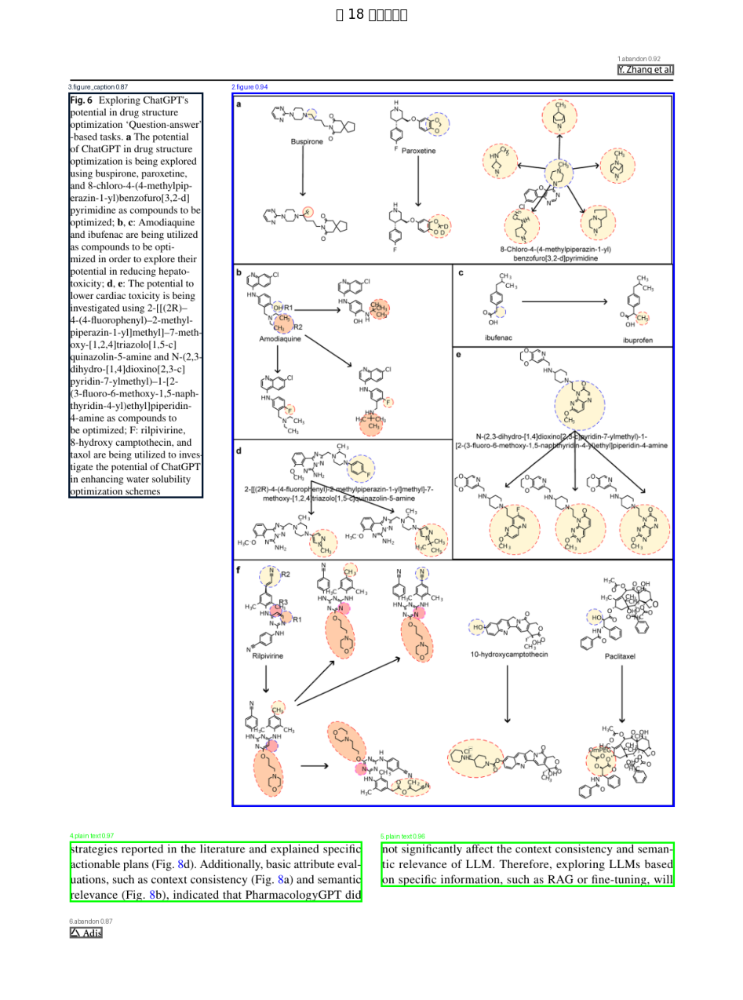


处理第 19/24 页

0: 1024x800 1 plain text, 3 abandons, 1 figure, 2 figure_captions, 1561.9ms
Speed: 6.4ms preprocess, 1561.9ms inference, 0.5ms postprocess per image at shape (1, 3, 1024, 800)
第 19 页检测到的布局元素数量: 7
第 19 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [100, 64, 538, 82], 'confidence': 0.8676693439483643}, {'type': 'abandon', 'coordinates': [145, 64, 515, 82], 'confidence': 0.4990276098251343}, {'type': 'figure', 'coordinates': [169, 108, 1023, 1324], 'confidence': 0.9628574848175049}, {'type': 'figure_caption', 'coordinates': [99, 1349, 580, 1410], 'confidence': 0.9521031975746155}, {'type': 'plain text', 'coordinates': [610, 1349, 1090, 1390], 'confidence': 0.4861982464790344}, {'type': 'figure_caption', 'coordinates': [610, 1349, 1090, 1390], 'confidence': 0.33072829246520996}, {'type': 'abandon', 'coordinates': [1037, 1476, 1090, 1493], 'confidence': 0.8923205137252808}]
1. abandon
2. abandon
3. figure
4. figure_caption
5. plain text
6. figure_caption
7. abandon


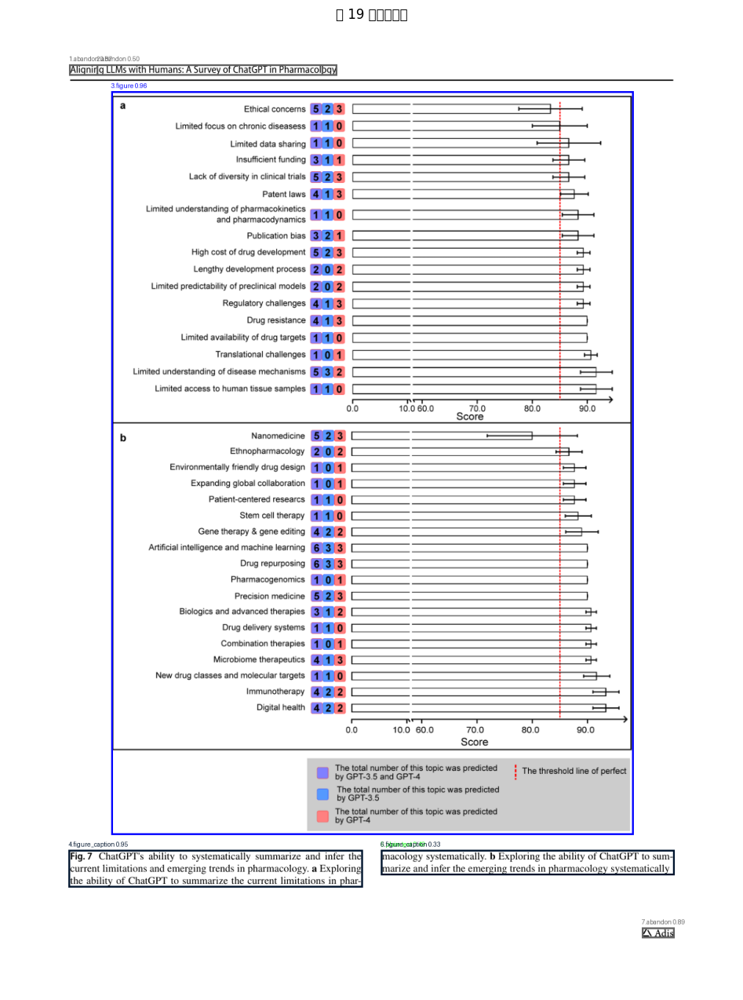


处理第 20/24 页

0: 1024x800 1 title, 7 plain texts, 2 abandons, 1 figure, 2 figure_captions, 1536.5ms
Speed: 4.3ms preprocess, 1536.5ms inference, 0.1ms postprocess per image at shape (1, 3, 1024, 800)
第 20 页检测到的布局元素数量: 13
第 20 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [997, 64, 1089, 81], 'confidence': 0.919251561164856}, {'type': 'plain text', 'coordinates': [101, 110, 579, 158], 'confidence': 0.9579839110374451}, {'type': 'plain text', 'coordinates': [612, 112, 1091, 559], 'confidence': 0.9829688668251038}, {'type': 'plain text', 'coordinates': [101, 162, 579, 359], 'confidence': 0.9817100167274475}, {'type': 'plain text', 'coordinates': [101, 362, 579, 659], 'confidence': 0.9850937128067017}, {'type': 'plain text', 'coordinates': [612, 562, 1091, 984], 'confidence': 0.9811831712722778}, {'type': 'title', 'coordinates': [101, 707, 241, 734], 'confidence': 0.9075537323951721}, {'type': 'plain text', 'coordinates': [101, 761, 579, 984], 'confidence': 0.9824793338775635}, {'type': '

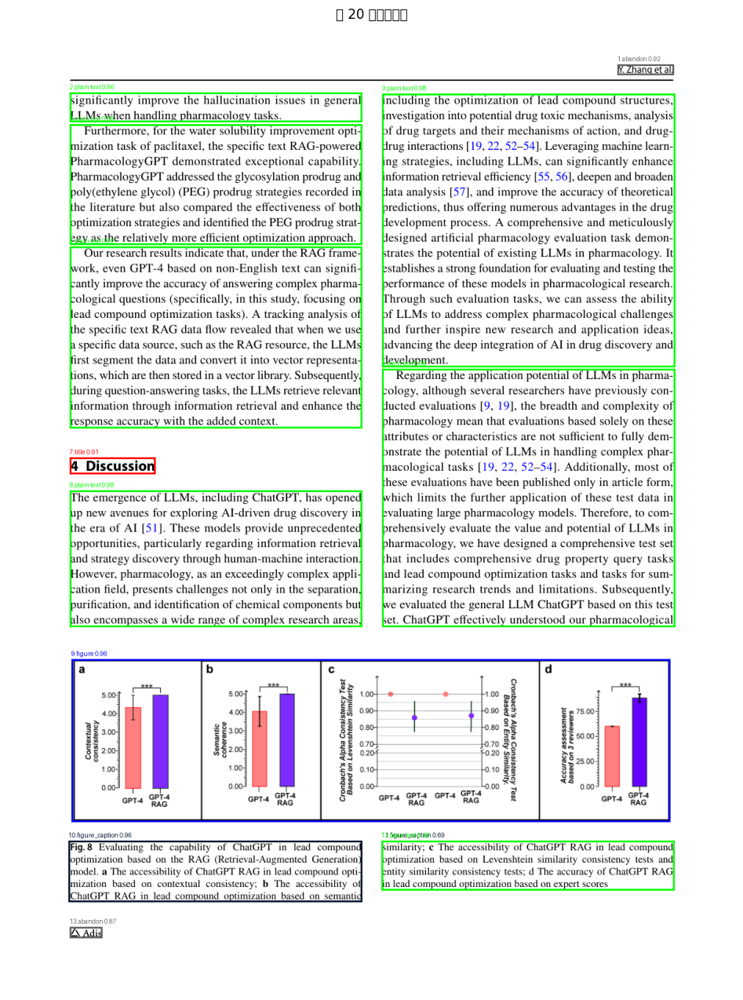


处理第 21/24 页

0: 1024x800 1 title, 5 plain texts, 3 abandons, 1461.3ms
Speed: 4.5ms preprocess, 1461.3ms inference, 0.3ms postprocess per image at shape (1, 3, 1024, 800)
第 21 页检测到的布局元素数量: 9
第 21 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [100, 63, 538, 82], 'confidence': 0.8658573031425476}, {'type': 'abandon', 'coordinates': [132, 63, 503, 82], 'confidence': 0.26092684268951416}, {'type': 'plain text', 'coordinates': [100, 108, 580, 1134], 'confidence': 0.9739648103713989}, {'type': 'plain text', 'coordinates': [612, 112, 1091, 484], 'confidence': 0.9817662239074707}, {'type': 'title', 'coordinates': [611, 532, 755, 559], 'confidence': 0.9142599105834961}, {'type': 'plain text', 'coordinates': [611, 584, 1091, 1360], 'confidence': 0.9781569838523865}, {'type': 'plain text', 'coordinates': [101, 1136, 580, 1435], 'confidence': 0.98158860206604}, {'type': 'plain text', 'coordinates': [611, 1378, 1089, 1418], 'confidence': 0.860004723072052}, {'type': 'abandon', 'coordinates': [1036

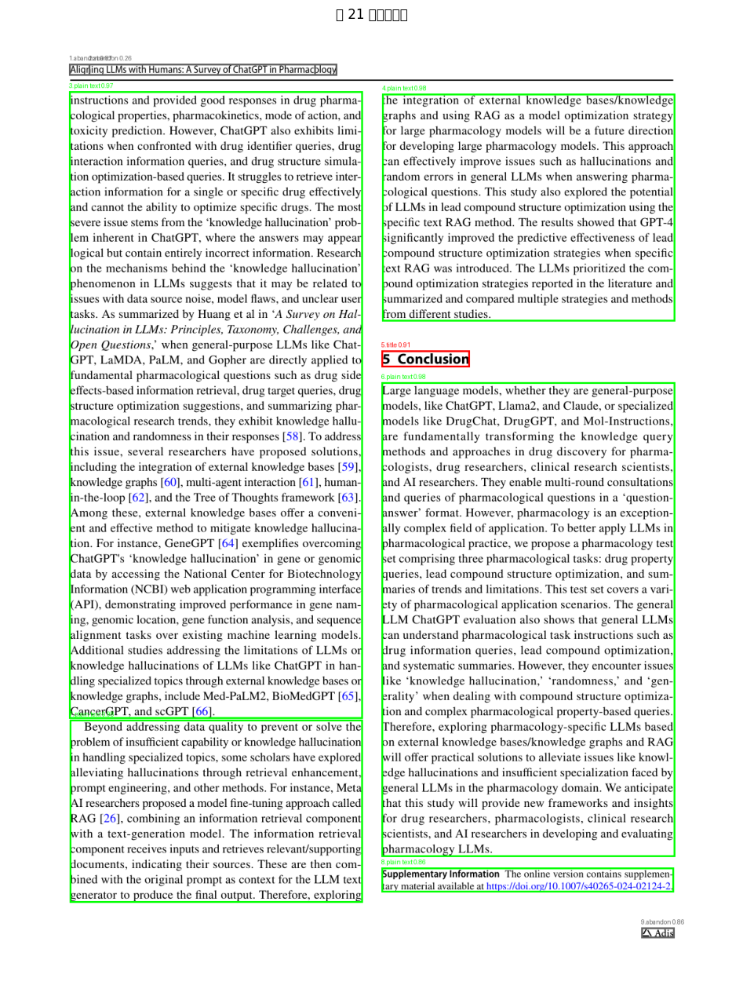


处理第 22/24 页

0: 1024x800 2 titles, 8 plain texts, 2 abandons, 1471.5ms
Speed: 4.4ms preprocess, 1471.5ms inference, 0.1ms postprocess per image at shape (1, 3, 1024, 800)
第 22 页检测到的布局元素数量: 12
第 22 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [997, 64, 1089, 81], 'confidence': 0.9219453930854797}, {'type': 'plain text', 'coordinates': [611, 105, 1093, 1390], 'confidence': 0.9643799662590027}, {'type': 'title', 'coordinates': [100, 110, 218, 134], 'confidence': 0.8938978910446167}, {'type': 'plain text', 'coordinates': [100, 154, 579, 234], 'confidence': 0.9588288068771362}, {'type': 'plain text', 'coordinates': [100, 264, 579, 303], 'confidence': 0.9195782542228699}, {'type': 'plain text', 'coordinates': [101, 324, 580, 464], 'confidence': 0.9663875102996826}, {'type': 'plain text', 'coordinates': [101, 485, 320, 504], 'confidence': 0.7873850464820862}, {'type': 'plain text', 'coordinates': [101, 525, 579, 724], 'confidence': 0.9697328209877014}, {'type': 'plain text', 'coordinates':

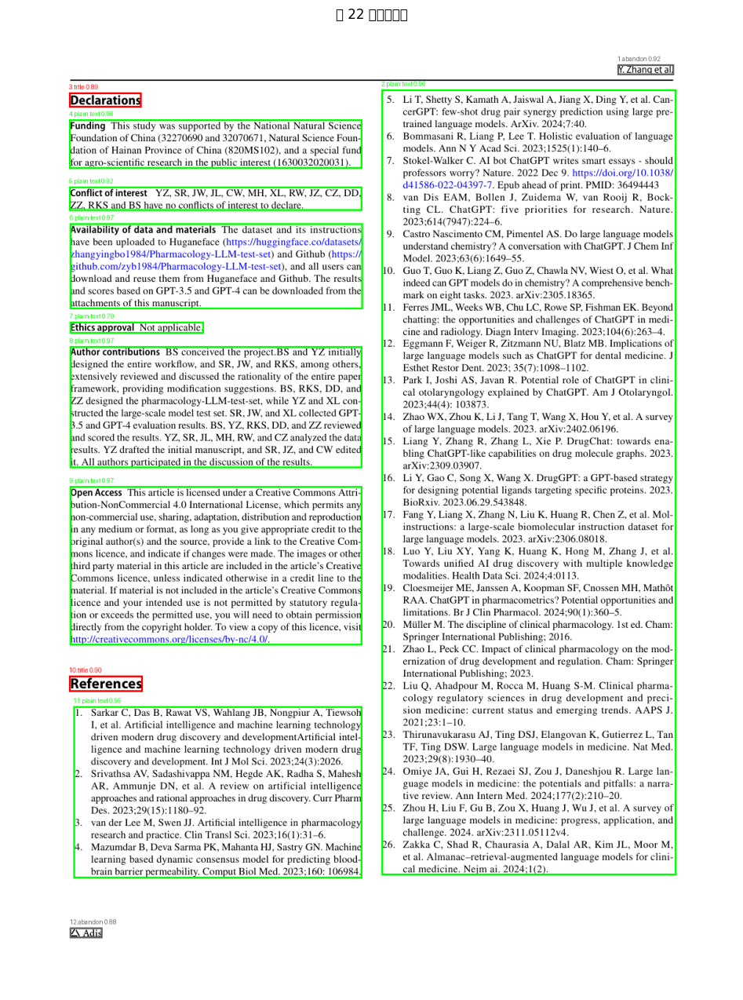


处理第 23/24 页

0: 1024x800 2 plain texts, 3 abandons, 1498.4ms
Speed: 4.6ms preprocess, 1498.4ms inference, 0.3ms postprocess per image at shape (1, 3, 1024, 800)
第 23 页检测到的布局元素数量: 5
第 23 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [99, 63, 539, 82], 'confidence': 0.839292049407959}, {'type': 'abandon', 'coordinates': [145, 63, 515, 82], 'confidence': 0.4143425524234772}, {'type': 'plain text', 'coordinates': [98, 106, 584, 1357], 'confidence': 0.9802796840667725}, {'type': 'plain text', 'coordinates': [608, 107, 1092, 1314], 'confidence': 0.9822402596473694}, {'type': 'abandon', 'coordinates': [1036, 1475, 1091, 1494], 'confidence': 0.864039957523346}]
1. abandon
2. abandon
3. plain text
4. plain text
5. abandon


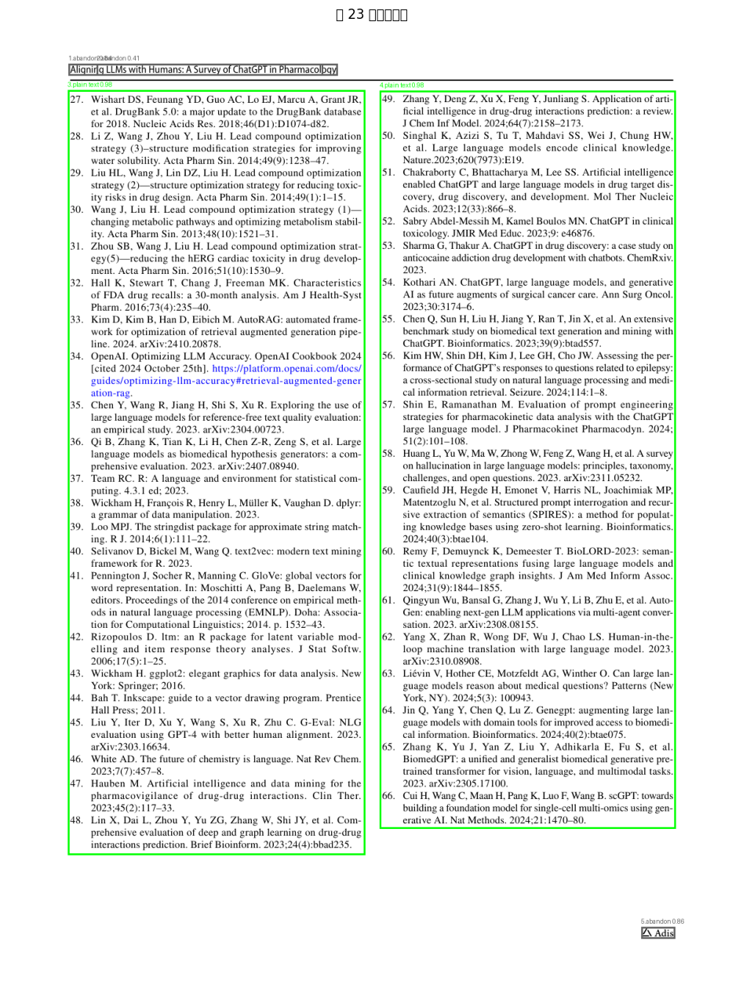


处理第 24/24 页

0: 1024x800 2 titles, 8 plain texts, 2 abandons, 1473.8ms
Speed: 6.1ms preprocess, 1473.8ms inference, 0.4ms postprocess per image at shape (1, 3, 1024, 800)
第 24 页检测到的布局元素数量: 12
第 24 页检测到的元素类型:
[{'type': 'abandon', 'coordinates': [997, 64, 1089, 82], 'confidence': 0.9004586338996887}, {'type': 'title', 'coordinates': [101, 112, 356, 140], 'confidence': 0.9253495335578918}, {'type': 'title', 'coordinates': [100, 162, 1024, 216], 'confidence': 0.7401304841041565}, {'type': 'plain text', 'coordinates': [100, 162, 1024, 216], 'confidence': 0.3004174530506134}, {'type': 'plain text', 'coordinates': [610, 242, 1062, 323], 'confidence': 0.9228417277336121}, {'type': 'plain text', 'coordinates': [110, 243, 307, 283], 'confidence': 0.8840770721435547}, {'type': 'plain text', 'coordinates': [101, 302, 504, 383], 'confidence': 0.9230442047119141}, {'type': 'plain text', 'coordinates': [610, 333, 1024, 373], 'confidence': 0.9090321660041809}, {'type': 'plain text', 'coordinates': [6

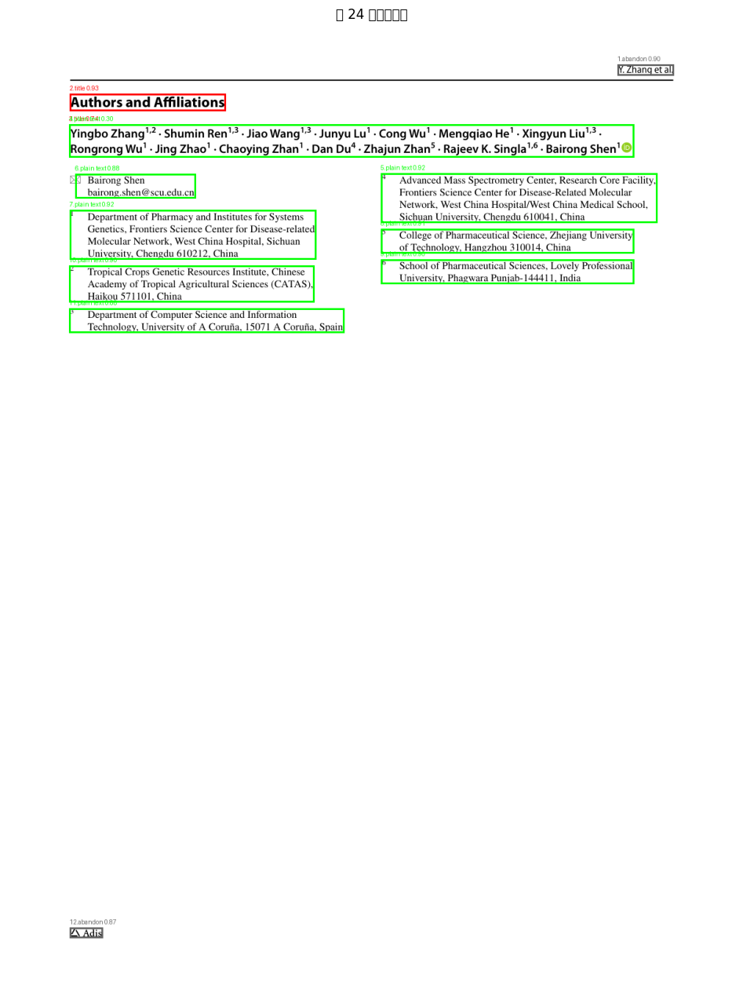

In [47]:
# 2. 测试布局分析
def test_layout_analysis(pdf_content):
    """测试布局分析"""
    # 初始化布局分析器
    layout_analyzer = LayoutAnalyzer(models_dir=os.path.join(project_root, "models"), device="cpu")
    
    # 打开PDF
    doc = fitz.open(stream=pdf_content, filetype="pdf")
    total_pages = len(doc)
    print(f"PDF总页数: {total_pages}")
    
    # 处理所有页面（或最多200页）
    max_pages = min(200, total_pages)
    
    for page_idx in range(max_pages):
        print(f"\n处理第 {page_idx+1}/{max_pages} 页")
        page = doc[page_idx]
        
        # 渲染页面为图像
        pix = page.get_pixmap(matrix=fitz.Matrix(2, 2))  # 使用2x缩放获得更清晰的图像
        img_data = pix.tobytes("png")
        img = Image.open(io.BytesIO(img_data))
        img_np = np.array(img)
        
        # 分析布局
        layout_results = layout_analyzer.analyze_page(img_np)
        print(f"第 {page_idx+1} 页检测到的布局元素数量: {len(layout_results)}")
        
        # 可视化布局
        visualizer = PDFVisualization()
        layout_img = img.copy()
        draw = ImageDraw.Draw(layout_img)
        
        # 为不同类型的元素使用不同颜色
        colors = {
            "plain text": (0, 255, 0),
            "title": (255, 0, 0),
            "figure": (0, 0, 255),
            "table": (255, 165, 0),
            "table_caption":(255, 135, 0),
            "table_footnote":(255, 100, 0),
            "isolate_formula": (128, 0, 128),
            "list": (0, 255, 255),
            "figure_caption":(0,20,45),
            "abandon": (100, 100, 100)  # 添加abandon类型的颜色
        }
        
        print(f"第 {page_idx+1} 页检测到的元素类型:")
        print(layout_results)
        for i, block in enumerate(layout_results):
            block_type = block["type"]
            print(f"{i+1}. {block_type}")
            x0, y0, x1, y1 = block["coordinates"]
            color = colors.get(block_type, (0, 0, 200))
            
            # 绘制边界框
            draw.rectangle([x0, y0, x1, y1], outline=color, width=3)
            
            # 添加标签
            confidence = block.get("confidence", 0)
            label = f"{i+1}.{block_type} {confidence:.2f}"
            draw.text((x0, y0-15), label, fill=color)
        
        # 显示带有布局标注的图像
        plt.figure(figsize=(12, 16))
        plt.imshow(layout_img)
        plt.title(f"第 {page_idx+1} 页布局分析")
        plt.axis('off')
        plt.show()
    
    return layout_results  # 返回最后一页的结果

# 测试布局分析
layout_results = test_layout_analysis(pdf_content)

PDF总页数: 24

处理第 1/24 页
原始页面尺寸: (595.2760009765625, 790.8660278320312)
渲染后图像尺寸: (1191, 1582)

0: 1024x800 3 titles, 10 plain texts, 6 abandons, 16482.7ms
Speed: 845.0ms preprocess, 16482.7ms inference, 17.1ms postprocess per image at shape (1, 3, 1024, 800)
第 1 页检测到的布局元素数量: 19
第 1 页检测到的元素类型:
1. abandon
2. abandon
3. abandon
4. title
  文本: SurveyofChatGPT'sAptitudeinPharmacology
'e'n! un<bux · ah oeibbuaw . ,nm buo . ,n7 n<unr . ebuem oe!...
5. plain text
  文本: Accepted: 11 November 2024
The Author(s) 2024
6. plain text
  文本: AimsThisstudyaimstoprovide
specializedLLMsinpharmacolog
7. title
  文本: general-purp
厂
8. plain text
  文本: optimization,andtrendsummarizationinpharmacology,showingsignificantpotentialinbasicpharmacologytasks...
9. plain text
  文本: forinterdisciplinarypharmacologyresearchers.However,thelimitationsofChatGPTbecomeevidentwhenhandling...
10. plain text
  文本: This lack of depth in knowledge integration and analysis limits its application in scientific resear...
11. plain t

ERROR:app.services.pdf.text:文本提取失败: 'NoneType' object is not iterable
ERROR:app.services.pdf.text:文本提取失败: 'NoneType' object is not iterable


  文本: Publishedonline:20December2
14. plain text
  文本: △Adis
15. plain text
16. plain text
17. abandon
18. abandon
19. abandon


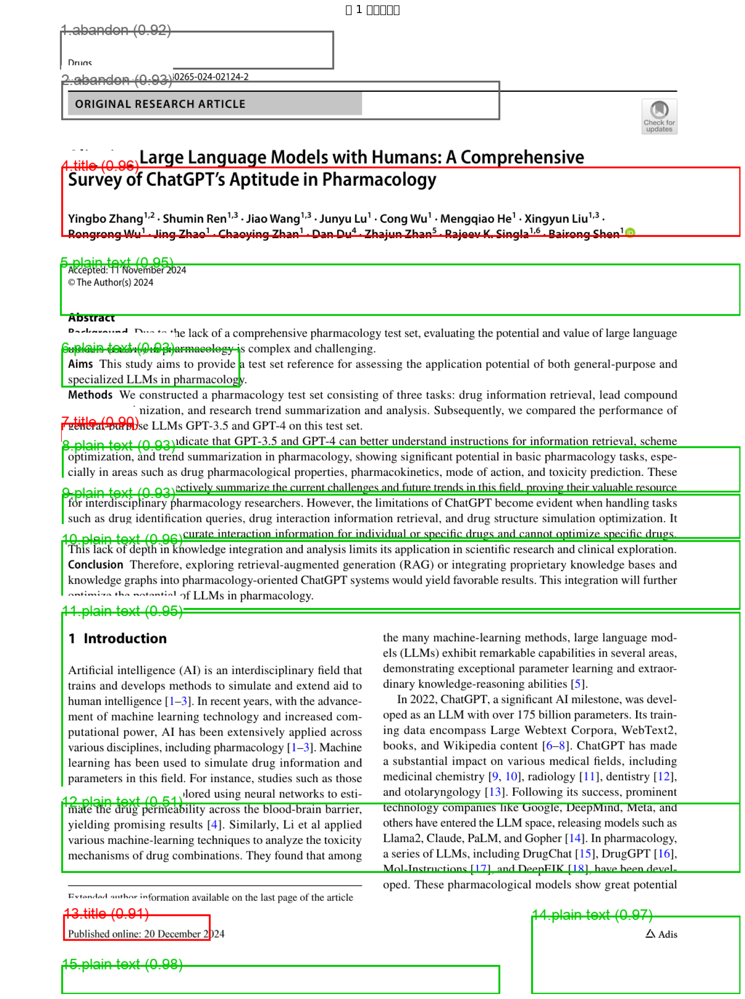


提取内容统计:
  文本块: 13
  公式: 0
  表格: 0
  图片: 0

处理第 2/24 页
原始页面尺寸: (595.2760009765625, 790.8660278320312)
渲染后图像尺寸: (1191, 1582)




KeyboardInterrupt


KeyboardInterrupt



In [58]:
# 4. 增强版PDF布局分析函数，包含公式、表格和图片解析
def analyze_pdf_with_elements(pdf_content, max_pages=200):
    """
    分析PDF布局并解析公式、表格和图片
    
    Args:
        pdf_content: PDF文档的二进制内容
        max_pages: 最大处理页数
        
    Returns:
        PDFLayoutInfo对象，包含布局和元素信息
    """
    # 初始化各种分析器
    layout_analyzer = LayoutAnalyzer(models_dir=os.path.join(project_root, "models"), device="cpu")
    text_extractor = TextExtractor(models_dir=os.path.join(project_root, "models"), device="cpu")
    formula_extractor = FormulaExtractor(models_dir=os.path.join(project_root, "models"), device="cpu")
    table_extractor = TableExtractor(models_dir=os.path.join(project_root, "models"), device="cpu")
    visualizer = PDFVisualization()
    
    # 初始化布局信息存储结构
    layout_info = PDFLayoutInfo(pdf_content=pdf_content)
    
    # 打开PDF
    doc = fitz.open(stream=pdf_content, filetype="pdf")
    total_pages = len(doc)
    print(f"PDF总页数: {total_pages}")
    
    # 处理所有页面（或最多max_pages页）
    pages_to_process = min(max_pages, total_pages)
    
    for page_idx in range(pages_to_process):
        print(f"\n处理第 {page_idx+1}/{pages_to_process} 页")
        page = doc[page_idx]
        
        # 获取原始页面尺寸
        original_size = (page.rect.width, page.rect.height)
        print(f"原始页面尺寸: {original_size}")
        
        # 渲染页面为图像
        pix = page.get_pixmap(matrix=fitz.Matrix(2, 2))  # 使用2x缩放获得更清晰的图像
        img_data = pix.tobytes("png")
        img = Image.open(io.BytesIO(img_data))
        img_np = np.array(img)
        
        
        # 获取渲染后的图像尺寸
        rendered_size = (img.width, img.height)
        print(f"渲染后图像尺寸: {rendered_size}")
        
        # 分析布局
        layout_results = layout_analyzer.analyze_page(img_np)
        print(f"第 {page_idx+1} 页检测到的布局元素数量: {len(layout_results)}")
        
        # 获取模型处理的尺寸
        model_size = (800, 1024)
        if hasattr(layout_analyzer, 'model_input_size'):
            model_size = layout_analyzer.model_input_size
        
        # 存储布局信息
        layout_info.add_page(page_idx, layout_results, rendered_size, model_size, original_size)
        
        # 创建可视化图像
        layout_img = img.copy()
        draw = ImageDraw.Draw(layout_img)
        
        # 为不同类型的元素使用不同颜色
        colors = {
            "plain text": (0, 200, 0),      # 绿色
            "title": (255, 0, 0),           # 红色
            "figure": (0, 0, 255),          # 蓝色
            "table": (255, 165, 0),         # 橙色
            "table_caption": (255, 135, 0), # 深橙色
            "table_footnote": (255, 100, 0),# 红橙色
            "isolate_formula": (128, 0, 128), # 紫色
            "list": (0, 255, 255),          # 青色
            "figure_caption": (0, 20, 45),  # 深蓝色
            "abandon": (100, 100, 100),     # 灰色
        }
        
        # 尝试加载字体
        try:
            font = ImageFont.truetype("Arial.ttf", 24)
        except:
            font = ImageFont.load_default()
        
        print(f"第 {page_idx+1} 页检测到的元素类型:")
        for i, block in enumerate(layout_results):
            
            block_type = block["type"].lower()  # 转为小写以匹配颜色字典
            print(f"{i+1}. {block_type}")
            
            # 获取模型坐标
            model_coords = block["coordinates"]
            
            # 映射到渲染坐标
            mapped_coords = layout_info.map_coordinates(page_idx, model_coords)
            x0, y0, x1, y1 = mapped_coords
            
            # 更新block中的坐标为映射后的坐标
            block["original_coordinates"] = mapped_coords
            
            # 绘制边界框
            line_width = max(3, int(min(rendered_size) / 300))
            color = colors.get(block_type, (0, 0, 200))
            draw.rectangle([x0, y0, x1, y1], outline=color, width=line_width)
            
            # 添加标签
            
            confidence = block.get("confidence", 0)
            label = f"{i+1}.{block_type} ({confidence:.2f})"
            text_bbox = draw.textbbox((x0, y0-30), label, font=font)
            draw.rectangle(text_bbox, fill=(255, 255, 255, 200))
            draw.text((x0, y0-15), label, fill=color, font=font)
            
            # 裁剪区域
            try:
                crop_img = img.crop((x0, y0, x1, y1))
                crop_img_np = np.array(crop_img)
            except Exception as e:
                print(f"  裁剪失败: {e}")
                continue
            
            # 根据元素类型进行不同处理
            if block_type in ["plain text", "title"]:
                # 提取文本
                try:
                    extracted_text = text_extractor.extract_text(crop_img_np)
                    if extracted_text:
                        block["extracted_text"] = extracted_text
                        print(f"  文本: {extracted_text[:100]}{'...' if len(extracted_text) > 100 else ''}")
                except Exception as e:
                    print(f"  文本提取失败: {e}")
            
            elif block_type == "isolate_formula":
                # 提取公式
                try:
                    latex = formula_extractor.recognize_formula(crop_img_np)
                    if latex:
                        formula_info = {
                            "element_idx": i,
                            "coordinates": mapped_coords,
                            "latex": latex,
                            "confidence": confidence
                        }
                        layout_info.add_formula(page_idx, formula_info)
                        block["formula_idx"] = i
                        print(f"  公式: {latex[:100]}{'...' if len(latex) > 100 else ''}")
                except Exception as e:
                    print(f"  公式提取失败: {e}")
            
            elif block_type == "table":
                # 提取表格
                try:
                    table_markdown = table_extractor.extract_table(crop_img_np)
                    if not table_markdown:
                        # 如果高级表格识别失败，回退到基本方法
                        table_markdown = table_extractor.extract_table_basic(page, mapped_coords)
                    
                    if table_markdown:
                        table_info = {
                            "element_idx": i,
                            "coordinates": mapped_coords,
                            "markdown": table_markdown,
                            "confidence": confidence
                        }
                        layout_info.add_table(page_idx, table_info)
                        block["table_idx"] = i
                        print(f"  表格: {table_markdown[:100]}{'...' if len(table_markdown) > 100 else ''}")
                except Exception as e:
                    print(f"  表格提取失败: {e}")
            
            elif block_type == "figure":
                # 处理图片
                try:
                    img_base64 = visualizer.image_to_base64(crop_img)
                    figure_info = {
                        "element_idx": i,
                        "coordinates": mapped_coords,
                        "base64": img_base64,
                        "confidence": confidence,
                        "caption": "图片"
                    }
                    
                    # 尝试提取图片中的文本作为可能的标题
                    try:
                        img_text = text_extractor.extract_text(crop_img_np)
                        if img_text:
                            figure_info["caption"] = img_text
                    except:
                        pass
                    
                    layout_info.add_figure(page_idx, figure_info)
                    block["figure_idx"] = i
                    print(f"  图片已提取")
                except Exception as e:
                    print(f"  图片处理失败: {e}")
        
        # 显示带有布局标注的图像
        plt.figure(figsize=(15, 20))
        plt.imshow(layout_img)
        plt.title(f"第 {page_idx+1} 页布局分析", fontsize=16)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
        
        # 显示提取的内容统计
        print("\n提取内容统计:")
        print(f"  文本块: {len([b for b in layout_results if b['type'].lower() in ['plain text', 'title']])}")
        print(f"  公式: {len(layout_info.get_formulas(page_idx))}")
        print(f"  表格: {len(layout_info.get_tables(page_idx))}")
        print(f"  图片: {len(layout_info.get_figures(page_idx))}")
    
    return layout_info

# 测试增强版PDF布局分析
pdf_layout_info = analyze_pdf_with_elements(pdf_content)


## 第 1 页提取的元素

## 第 2 页提取的元素

### 表格 (1个):
1. 表格Markdown:
| 列1 | 列2 | 列3 |
| --- | --- | --- |
| 数据1 | 数据2 | 数据3 |


## 第 3 页提取的元素

## 第 4 页提取的元素

### 图片 (1个):
1. 图片标题: Chemical
Ib:Physicochemical
lia:lmprovemetabolism
toxicity
tifierQuery
PropertiesQuery
stablity
Translational
MolecularWeight
Amodiaquine
challenges
Chlkey
Monoisotopic
■Ibufenac
Regulatory
Weight
■
..,andothe
challenges
andother
..andother
chemicals
entifiers
.., and
Task
other topics
rug-Drug
properties
Ta
III
ction
nation
Ic:Pharmacological
PropertiesQuery
oss-tissuerisk
Pharmacodynamics
IId:Improvewate
IIc: Reduce liver
ervoussystem
Mechanismof action
solubility
Id:Drug target
toxicity
Futuretrending
seaserisk
..,and other.
Rilpivirine
pharmacological
■Drugrepurposing
Paclitaxel(Taxol)
Inhibitor
properties
8-hydroxyquinoline
Precisionmedicine
Antagonist
riaz.o
Artificial intelligence
., and othertarget
andmachine
■
learning
.., and other topics
chemicals
Task I: Drug Basic
Task II : Lead Compound
Task III : Limitat

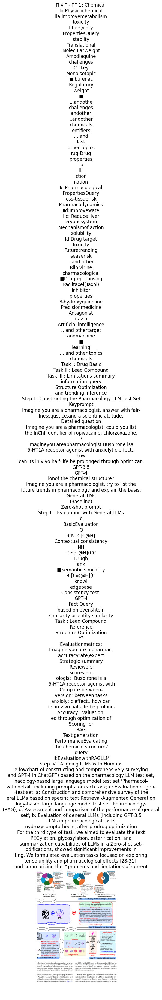


## 第 5 页提取的元素

### 公式 (1个):
1. LaTeX: E = mc^2

## 第 6 页提取的元素

## 第 7 页提取的元素

### 表格 (1个):
1. 表格Markdown:
| 列1 | 列2 | 列3 |
| --- | --- | --- |
| 数据1 | 数据2 | 数据3 |


## 第 8 页提取的元素

### 表格 (2个):
1. 表格Markdown:
| 列1 | 列2 | 列3 |
| --- | --- | --- |
| 数据1 | 数据2 | 数据3 |

2. 表格Markdown:
| 列1 | 列2 | 列3 |
| --- | --- | --- |
| 数据1 | 数据2 | 数据3 |


## 第 9 页提取的元素

### 图片 (1个):
1. 图片标题: eaccessibilityofChatGPTinthepharmacologicaltestset
The accessibility of ChatGPT in the pharmacological test set based
contextual consistency, semantic similarity, and consist-
on Levenshtein similarity consistency tests; d: The accessibility of
. a: The accessibility of ChatGPT in the pharmacological
sed on contextual consistency; b: The accessibility of Chat-
consistencytests
le pharmacological test set based on semantic similarity; c:
△Adis


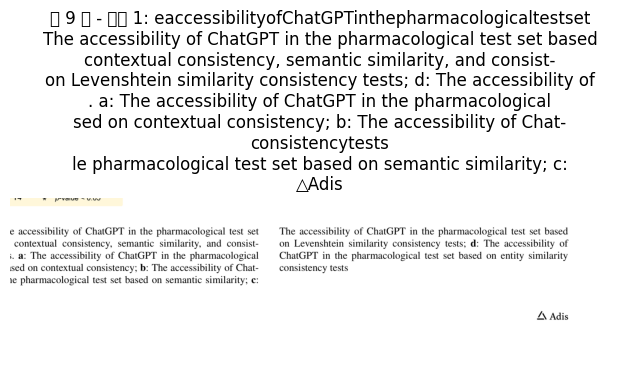


## 第 10 页提取的元素

### 表格 (1个):
1. 表格Markdown:
| 列1 | 列2 | 列3 |
| --- | --- | --- |
| 数据1 | 数据2 | 数据3 |


## 第 11 页提取的元素

## 第 12 页提取的元素

### 图片 (1个):
1. 图片标题: logP
Bioavailability
Polar surface are
Class
ht
GPT-3.5
GPT-4 
GPT-3.5
GPT-4
GPT-3.5
GPT-4
GPT-3.5
GPT-4
GPT-3.5
GPT-4
ClassA
√
√
×
NA
NA
NA
NA
NA
ClassA
×
×
NA
NA
NA
NA
NA
ClassA
×
NA
NA
NA
NA
NA
ClassA
V
√
NA
NA
NA
NA
ClassA
×
×
NA
NA
+
NA
NA
+
×
×
NA
NA
NA
NA
NA
+
ClassB
×
×
×
NA
NA
NA
NA
NA
+
√
√
√
NA
NA
×
×
NA
NA
×
×
×
NA
NA
NA
NA
√
SSB
NA
NA
NA
NA
√
NA
NA
√
NA
NA
+
×
NA
NA
+
NA
NA
NA
NA
√
√
√
NA
NA
√
√
NA
NA
V
×
NA
NA
×
NA
NA
+
V
NA
NA
×
×
NA
NA
logP*: The log conversion fraction to
The answers fulflls the record in DrugBank.
oil-waterpartitioncoefficient
x
 The answers doesn't fulfills the record in DrugBank.
NA The ChatGPT couldn't answer the query.
C
600.00
Dequaliniun
Monteluk
 Dequalinium
silodosin
500.00
Silodosin
*Apremilast
Apremilast
Camostat irbesartan
rbesartan
400.00
ocine
Peflox
Pefloxa
Dezocine
Camostat
pNaltre

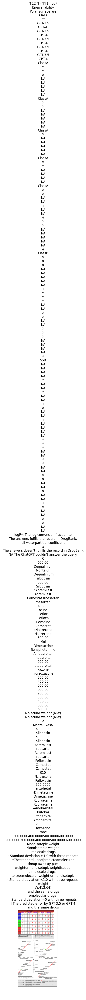


## 第 13 页提取的元素

## 第 14 页提取的元素

### 表格 (1个):
1. 表格Markdown:
| 列1 | 列2 | 列3 |
| --- | --- | --- |
| 数据1 | 数据2 | 数据3 |


## 第 15 页提取的元素

### 图片 (1个):
1. 图片标题: ADRA2A
2
GABRA3
GABRA3
GRIA2
Amobarbital
Benzphetamine
 Butobarbital
Chlorzoxazone
Dezocine
CHRNA7
GABRA4
GABRA4
NA4
GABRA5
CHRNA4
GABRA5
SLC18A2
SLC6A3
GABRA6
GABRA6
KCNMA1
OPRK1
PRSS1
TMPRSS2
OPRK1
Camostat
Naltrexone
 Pefloxacin
[Ropivacaine]
Dimetacrine
ST14
CCK
OPRM1SIGMAR1
TO
SCN10A
ADR
A1B
NGA1
ALOX5
LTC4S
CALM1
[Dequalinium]
 Silodosin
Irbesartan
Montelukast
Apremilast
AP
SNCA
ADRA1D KCNH2
CYSLTR1LTB4R
PRKCA
KCNMA1
The drugs random selected from Drugbank according
The protein target mispredict by GPT-3.5 and
intagonist
to molecular weight quartering strategy.
GPT-4.
nhibitor
The protein target accroding to the record of Drugbank
The protein target mispredict by GPT-3.5.
database.
The protein target mispredict by GPT-4.
locker
The_protein target accurately predicted by GPT-3.5 and
GPT-4.
Agonist
The protein target accuratel

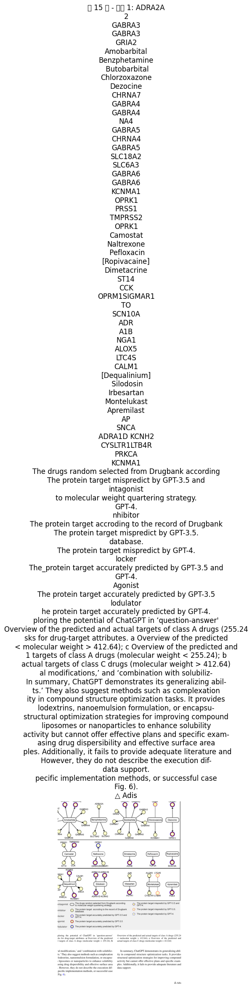


## 第 16 页提取的元素

### 图片 (2个):
1. 图片标题: Y. Zhang et al.
k
Nervous system disease risk
Heart disease risk
Blood system risk
risk
 Central nervous system depressant 
Cardiac Arrhythmia risk 
Methemoglobinemia risk
(CNS depressant) risk 
00000
70000
24302922 50
01000
000165
07108
010000
Bradycardia risk
 Hypertension risk 
Neurotoxic risk
00001
062000
01001
00100
010000
01000
00000
00000
 Corrected QT Interval
Hypotensive risk
Opioid antagonism risk
(QTc) prolong risk 
27102001
00002
00000
082509
01200
001210
00133028
isk
00000
00000
 Orthostatic hypo-
 Sedative activity
Tachycardia risk
tension risk
3332136
02000
00000
00100
00000
o0000
00 00 62
Analgesic activity
Hyperkalemia risk
0140021
Respiratory disea$e
00000
002300
Respiratory depression
cacy
o0000
010 30 0 0
erapeutic
Neuropsychiatric risk
002700
Hyponatremia risk
00100
oooo
00000
00100
Hypoglycemic risk
apeutic
00000
06000
0000 0
Thrombogenic risk
00000
00006
ismrate
00000
Muscle disease
 Myopathy, rhabdomyolysis,
abolism
and myo

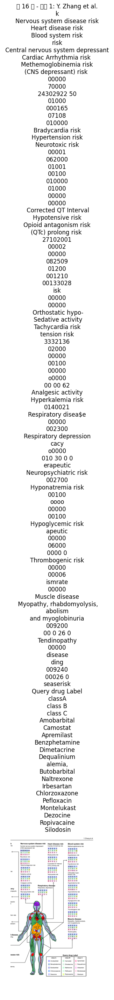

2. 图片标题: Y. Zhang et al.
Nervous system disease risk
Heart disease risk
Blood system risk
isk
Central nervous system depressant 
Cardiac Arrhythmia risk
 Methemoglobinemia risk
(CNS depressant) risk
70000
24 30 292250
01000
000165
07108
0000o
010000
o000o
Bradycardia risk
 Hypertension risk 
 Neurotoxic risk
00001
062000
01001
00100
010000
01000
00000
00000
Corrected QT Interval
Hypotensive risk
Opioid antagonism risk 
(QTc) prolong risk 
27102 001
00002
00000
082509
01200
001210
00133 028
sk
00000
00000
 Orthostatic hypo-
 Sedative activity 
Tachycardia risk
tension risk
3332136
02000
00000
00100
00000
00000
00000
000062
Analgesic activity
个
Hyperkalemia risk 
0140021
Respiratory disea$e
00000
00 23 0 0
Respiratory depression
cacy
00000
010 30 0 0
erapeutic
Neuropsychiatric risk
002700
Hyponatremia risk
00100
00000
00000
00100
00000
0000o
Hypoglycemic risk 
peutic
00000
06000
o00oo
Thrombogenic risk
00000
00006
ismrate
0000 o
Muscle disease
 Myopathy, rhabdomyolysis,
and myoglobinuria

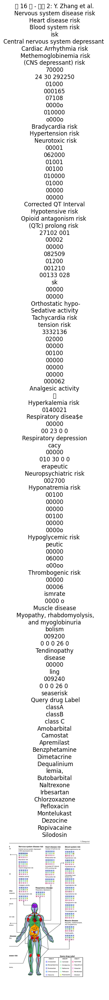


## 第 17 页提取的元素

## 第 18 页提取的元素

### 图片 (1个):
1. 图片标题: 8-Chloro-4-(4-methylpiperazin-1-yl)
benzofuro[3,2-d]pyrimidine
CH3
CH3
(CHa)
OH
OH
ibufenac
ibuprofen
ayridin-7-ylmethyl)-1-
HN
CH3F
/camptothecin
Paclitaxel
affect the context consistency and seman-
LLM. Therefore, exploring LLMs based
nation, such as RAG or fine-tuning, will


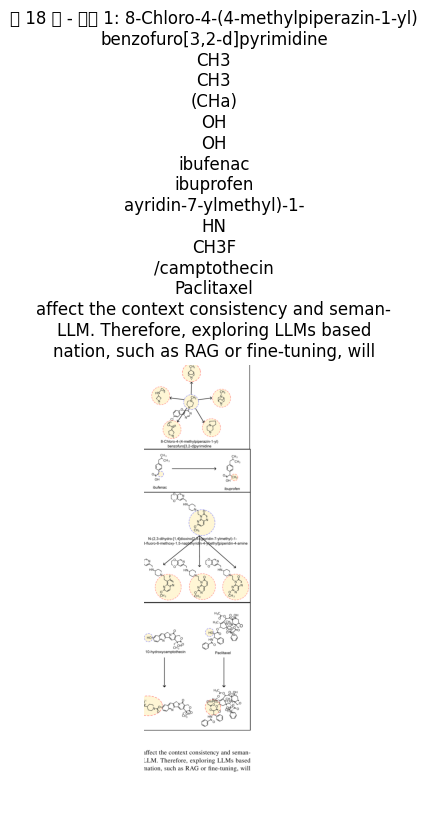


## 第 19 页提取的元素

### 图片 (1个):
1. 图片标题: Ethical concerns
523
d focus on chronic diseasess 
000
Limited data sharing
000
Insuficient funding 311
ck of diversity in clinical trials
523
Patent laws
④03
standing of pharmacokinetics
000
 and pharmacodynamics
 Publication bias
320
gh cost of drug development 
523
engthy development process 
202
ctability of preclinical models 
202
 Regulatory challenges 
403
中
Drug resistance
403
ed availability of drug targets
000
 Translational challenges
000
中
iding of disease mechanisms 
532
ess tohuman tissue samples
000
0.0
10.0 60.0
70.0
80.0
90.0
Score
Nanomedicine 
523
Ethnopharmacology 
202
mentally friendly drug design
000 C
xpanding global collaboration 
0001
Patient-centered researcs
000
 Stem cell therapy
000
Gene therapy& gene editing
④22 
igence and machine learning
633
 Drug repurposing 
633
Pharmacogenomics
000
 Precision medicine
523
gics and advanced therapies 
302
中
 Drug delivery systems
000
Combination therapies
000
甲
Microbiome therape

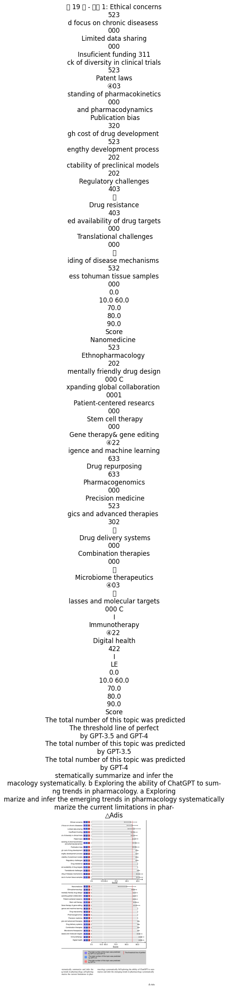


## 第 20 页提取的元素

### 图片 (1个):
1. 图片标题: 图片


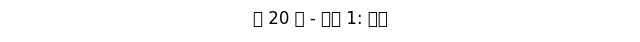


## 第 21 页提取的元素

## 第 22 页提取的元素

## 第 23 页提取的元素

## 第 24 页提取的元素

## 生成的Markdown预览 (前500字符):
## 第 1 页

### Zhang12 Shumin Ren1,3 . Jiao Wang1,3 . Junyu Lu' . Cong Wu' . Mengqiao He' . Xingyun Liu1,3 .
ng Wu' · Jing Zhao' . Chaoying Zhan' · Dan Du4 . Zhajun Zhan5 · Rajeev K. Singla1,6 . Bairong Shen'@
:11November2024
thor(s)2024

ound Due to the lack of a comprehensive pharmacology test set, evaluating the potential and value of large language
(LLMs) in pharmacology is complex and challenging.
chis study aims to provide a test set reference for assessing the application potential of both...


In [53]:
# 5. 展示提取的公式、表格和图片
def display_extracted_elements(pdf_layout_info):
    """展示提取的公式、表格和图片"""
    # 遍历所有页面
    for page_idx in range(len(pdf_layout_info.pages)):
        print(f"\n## 第 {page_idx+1} 页提取的元素")
        
        # 展示公式
        formulas = pdf_layout_info.get_formulas(page_idx)
        if formulas:
            print(f"\n### 公式 ({len(formulas)}个):")
            for i, formula in enumerate(formulas):
                latex = formula.get("latex", "")
                print(f"{i+1}. LaTeX: {latex}")
                
                # 如果需要可视化公式，可以使用matplotlib或其他工具
        
        # 展示表格
        tables = pdf_layout_info.get_tables(page_idx)
        if tables:
            print(f"\n### 表格 ({len(tables)}个):")
            for i, table in enumerate(tables):
                markdown = table.get("markdown", "")
                print(f"{i+1}. 表格Markdown:\n{markdown}")
        
        # 展示图片
        figures = pdf_layout_info.get_figures(page_idx)
        if figures:
            print(f"\n### 图片 ({len(figures)}个):")
            for i, figure in enumerate(figures):
                caption = figure.get("caption", "图片")
                print(f"{i+1}. 图片标题: {caption}")
                
                # 显示图片
                img_base64 = figure.get("base64", "")
                if img_base64:
                    img_data = base64.b64decode(img_base64)
                    img = Image.open(io.BytesIO(img_data))
                    plt.figure(figsize=(8, 6))
                    plt.imshow(img)
                    plt.title(f"第 {page_idx+1} 页 - 图片 {i+1}: {caption}")
                    plt.axis('off')
                    plt.show()
    
    # 生成完整的Markdown
    markdown = pdf_layout_info.to_markdown()
    print("\n## 生成的Markdown预览 (前500字符):")
    print(markdown[:500] + "...")
    
    return markdown

# 展示提取的元素
markdown_output = display_extracted_elements(pdf_layout_info)